In [1]:
import pandas as pd
# pd.options.plotting.backend = "plotly"
pd.set_option('display.max_rows',1000)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import glob
from tqdm.notebook import tqdm
import math,statistics
from scipy.stats.mstats import winsorize
from scipy.spatial import distance
from analysis_module import *

# Fixation

In [2]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

def confidence_ellipse(x, y, ax, n_std=3, facecolor='none', **kwargs):

    assert x.size == y.size, "x and y must be the same size"

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 4, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

def fix_plot(pts, df, figsize=(18,9),kind = 'err'):
    '''
    use kind from one of the following: all_subjects, err, ellipse
    '''
    fig,ax = plt.subplots(figsize=figsize)
    pallete = iter(sns.color_palette('colorblind',13))
    for key in range(13):
        c = next(pallete)
        gt = pts[key]
        xs = winsorize(df['mean_x'].apply( lambda x: x[key+1] ), limits=[0.1,0.1]) 
        ys = winsorize(df['mean_y'].apply( lambda y: y[key+1] ), limits=[0.1,0.1])
        if kind == 'all_subjects':
            ax.plot(gt[0],pt[1], marker="+", markersize=15, color = c)
            ax.scatter(xs,ys, color = c, s=60)
        elif kind == 'err':
            ax.errorbar(xs.mean(),ys.mean(),xerr = xs.std(),yerr = ys.std(),color = c,alpha=0.3, linestyle="None", marker = ".")
            ax.plot(gt[0],gt[1],marker="h", markersize = 10, color = c)
        elif kind == 'ellipse':
            ax.scatter(xs.mean(), ys.mean(), s=50, color = c)
            ax.plot(gt[0],gt[1],marker="+", mew=3, markersize = 12, color = c)
            confidence_ellipse(xs, ys, ax, n_std=1, edgecolor="black", alpha=0.8 )#, linestyle="--")
        else:
            ax.plot(xs.mean(),ys.mean(),marker = ".", markersize = 30 , color = c)
            ax.plot(gt[0],gt[1],marker="+", markersize = 15, color = c)  

#     ax.set_xlim(0,xlim)
#     ax.set_ylim(0,ylim)
    return ax

def subject_wise(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y","acc","rms","std"])
    for subb in tqdm(subjects):
        fix_analyse = Fixation(subb, show = False)
        trial_x,trial_y,rms,std  = fix_analyse.parse_trials(model, 'pred_x', 'pred_y', pred_final= True, show = False)
        rms,std = get_fix_precision(rms,std)
        acc = get_fix_acc(fix_analyse.gt_points, trial_x,trial_y)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "acc": acc,"rms":rms ,"std":std}, ignore_index = True)
    df["mean_x"] = df.trial_x.apply( lambda x: { k:winsorize(v, limits=[0.1,0.1]).mean() for k,v in x.items() } )
    df["mean_y"] = df.trial_y.apply( lambda x: { k:winsorize(v, limits=[0.1,0.1]).mean() for k,v in x.items() } )
    return df

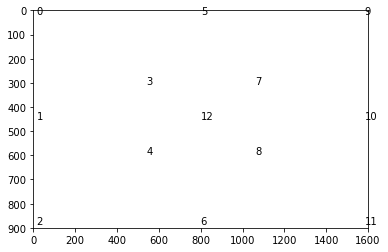

In [91]:
##nvm
# pts = [(800,450),(200,112),(800,112),(1400,112),(200,448),(1400,448),(200,784),(800,784),(1400,784),(600,336),(600,560),(1000,336),(1000,560),(800,500)]
pts = [(16, 16), (16, 450), (16, 884), (539, 305), (539, 595), (800, 16), (800, 884), (1061, 305), (1061, 595), (1584, 16), (1584, 450), (1584, 884), (800, 450)]
# plt.figure(figsize=(18,9))
# color = cm.rainbow(np.linspace(0, 1, 14))
plt.xlim(0,1600)
plt.ylim(0,900)
for i,pt in enumerate(pts):
    plt.text(pt[0],pt[1],str(i))
plt.gca().invert_yaxis()

Recording length (ffmpeg):  46.790000
RecStop - RecStart :  46882.0
Total Frame Count :  700
Fix Frames Count :  490
FPS :  14.931103621859135
key press times :  [849, 4330, 7603, 10767, 14241, 18176, 21837, 25806, 29385, 33599, 37391, 41043, 44373]
position update times :  [3366, 6849, 10116, 13282, 16749, 20682, 24349, 28315, 31899, 36115, 39899, 43549, 46885]
diff :  [2517, 2519, 2513, 2515, 2508, 2506, 2512, 2509, 2514, 2516, 2508, 2506, 2512]


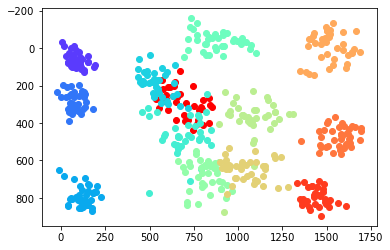

--------------------------------------------------
Recording length (ffmpeg):  51.733000
RecStop - RecStart :  51873.0
Total Frame Count :  774
Fix Frames Count :  487
FPS :  14.921057197385924
key press times :  [1370, 5238, 9040, 12616, 16216, 20235, 24452, 28273, 32530, 36593, 41020, 45267, 49365]
position update times :  [3878, 7745, 11561, 15131, 18731, 22747, 26964, 30781, 35047, 39097, 43531, 47781, 51886]
diff :  [2508, 2507, 2521, 2515, 2515, 2512, 2512, 2508, 2517, 2504, 2511, 2514, 2521]


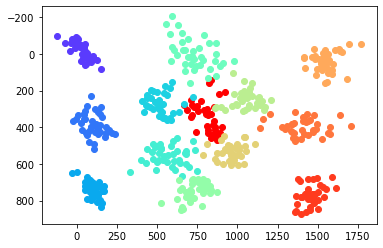

--------------------------------------------------
Recording length (ffmpeg):  53.728000
RecStop - RecStart :  53828.0
Total Frame Count :  804
Fix Frames Count :  487
FPS :  14.936464293676154
key press times :  [2370, 6056, 10445, 14387, 18241, 22161, 26179, 30585, 34728, 38879, 43225, 47135, 51319]
position update times :  [4876, 8560, 12960, 16893, 20745, 24676, 28694, 33093, 37243, 41393, 45743, 49643, 53862]
diff :  [2506, 2504, 2515, 2506, 2504, 2515, 2515, 2508, 2515, 2514, 2518, 2508, 2543]


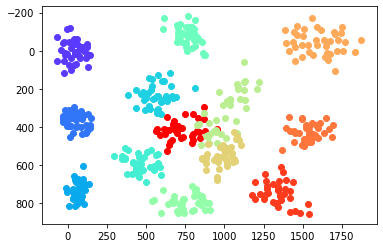

--------------------------------------------------
Recording length (ffmpeg):  50.798000
RecStop - RecStart :  50969.0
Total Frame Count :  760
Fix Frames Count :  488
FPS :  14.911024348133179
key press times :  [1916, 6732, 10547, 14607, 19197, 23117, 26549, 30519, 34241, 37635, 41105, 44773, 48459]
position update times :  [4421, 9237, 13054, 17121, 21708, 25621, 29054, 33038, 36754, 40154, 43621, 47291, 50987]
diff :  [2505, 2505, 2507, 2514, 2511, 2504, 2505, 2519, 2513, 2519, 2516, 2518, 2528]


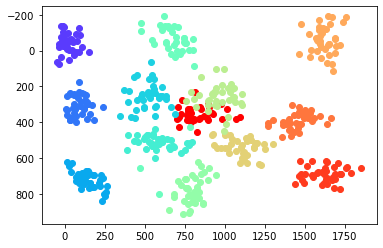

--------------------------------------------------
Recording length (ffmpeg):  47.403000
RecStop - RecStart :  47486.0
Total Frame Count :  709
Fix Frames Count :  490
FPS :  14.93071642168218
key press times :  [2145, 5601, 9102, 12164, 16089, 19686, 23355, 26587, 30364, 34221, 37944, 41486, 44976]
position update times :  [4662, 8111, 11612, 14678, 18595, 22195, 25862, 29095, 32878, 36730, 40466, 43997, 47489]
diff :  [2517, 2510, 2510, 2514, 2506, 2509, 2507, 2508, 2514, 2509, 2522, 2511, 2513]


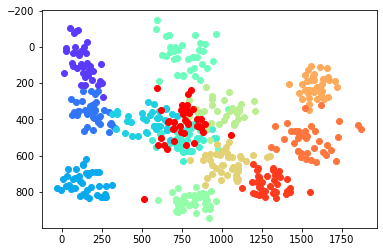

--------------------------------------------------
Recording length (ffmpeg):  48.929000
RecStop - RecStart :  48996.0
Total Frame Count :  732
Fix Frames Count :  489
FPS :  14.93999510164095
key press times :  [1603, 5233, 9329, 13309, 17127, 20854, 24845, 28697, 32277, 35711, 39351, 42856, 46487]
position update times :  [4110, 7744, 11844, 15828, 19629, 23361, 27360, 31211, 34794, 38227, 41861, 45361, 48998]
diff :  [2507, 2511, 2515, 2519, 2502, 2507, 2515, 2514, 2517, 2516, 2510, 2505, 2511]


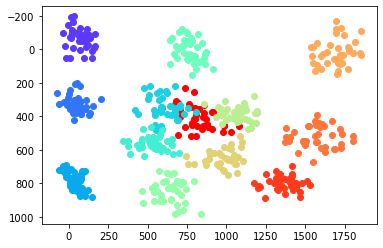

--------------------------------------------------
Recording length (ffmpeg):  46.065000
RecStop - RecStart :  46155.0
Total Frame Count :  689
Fix Frames Count :  487
FPS :  14.927960134329975
key press times :  [1220, 4814, 8050, 11564, 15054, 18386, 22134, 25960, 29494, 32938, 36244, 39818, 43648]
position update times :  [3723, 7323, 10556, 14073, 17557, 20890, 24639, 28473, 32006, 35456, 38756, 42323, 46166]
diff :  [2503, 2509, 2506, 2509, 2503, 2504, 2505, 2513, 2512, 2518, 2512, 2505, 2518]


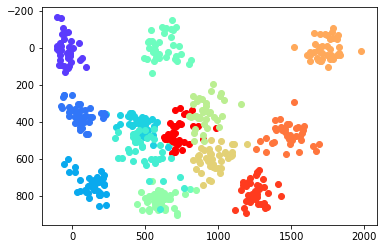

--------------------------------------------------
Recording length (ffmpeg):  47.843000
RecStop - RecStart :  47969.0
Total Frame Count :  716
Fix Frames Count :  490
FPS :  14.92630657299506
key press times :  [1721, 5693, 9217, 12977, 16629, 20289, 23923, 27869, 31539, 35063, 38455, 41927, 45461]
position update times :  [4240, 8205, 11722, 15488, 19138, 22805, 26438, 30372, 34055, 37572, 40972, 44438, 47998]
diff :  [2519, 2512, 2505, 2511, 2509, 2516, 2515, 2503, 2516, 2509, 2517, 2511, 2537]


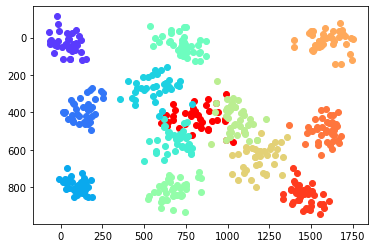

--------------------------------------------------
Recording length (ffmpeg):  49.713000
RecStop - RecStart :  49867.0
Total Frame Count :  744
Fix Frames Count :  492
FPS :  14.919686365732849
key press times :  [1457, 5407, 9164, 12794, 16413, 20016, 23830, 27461, 31146, 35310, 38968, 43458, 47358]
position update times :  [3962, 7912, 11679, 15312, 18929, 22529, 26346, 29979, 33662, 37829, 41479, 45962, 49870]
diff :  [2505, 2505, 2515, 2518, 2516, 2513, 2516, 2518, 2516, 2519, 2511, 2504, 2512]


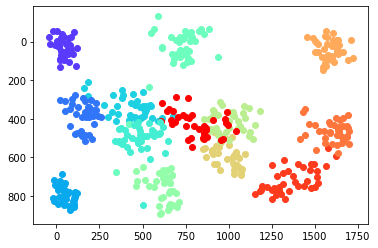

--------------------------------------------------
Recording length (ffmpeg):  47.812000
RecStop - RecStart :  47944.0
Total Frame Count :  715
Fix Frames Count :  490
FPS :  14.913232104121475
key press times :  [1873, 5940, 9789, 13499, 17013, 20359, 24147, 27557, 31181, 34647, 38285, 41804, 45435]
position update times :  [4388, 8455, 12305, 16005, 19521, 22871, 26655, 30071, 33688, 37155, 40802, 44320, 47947]
diff :  [2515, 2515, 2516, 2506, 2508, 2512, 2508, 2514, 2507, 2508, 2517, 2516, 2512]


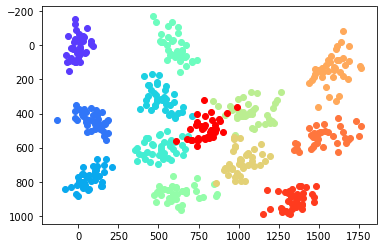

--------------------------------------------------


In [ ]:
#test
fix_analyse = Fixation("8","E","Beg", show = False)
trial_x,trial_y,rms,std  = fix_analyse.parse_trials(pred_path.MPII, 'pred_x', 'pred_y', pred_final= True, show = True)

### tests

In [283]:
##Test
for i in range(1,6):
    path = "Models/ETH-XGaze-master/ETH-XGaze-master/Subjects/s{}/model_outputs/Block_6".format(subb)
    temp = pd.read_csv(os.path.join(path,"Fixation{}.csv".format(i)))
    print(temp.shape)

(1867, 4)
(1907, 4)
(2223, 4)
(2222, 4)
(1858, 4)


In [ ]:
##Test
for i in os.listdir("Subjects/s8/301355"):
    if "FixRec" in i:
        print(get_frame_count("Subjects/s8/301355/"+i),i)

1858 blockNr_6_taskNr_12_trialNr_3_FixRec.webm
1639 blockNr_13_taskNr_12_trialNr_4_FixRec.webm
2184 blockNr_6_taskNr_11_trialNr_1_FixRec.webm
1585 blockNr_13_taskNr_12_trialNr_2_FixRec.webm
1867 blockNr_6_taskNr_12_trialNr_5_FixRec.webm
1615 blockNr_13_taskNr_12_trialNr_5_FixRec.webm
1907 blockNr_6_taskNr_12_trialNr_1_FixRec.webm
1593 blockNr_13_taskNr_12_trialNr_1_FixRec.webm
2222 blockNr_6_taskNr_12_trialNr_2_FixRec.webm
2223 blockNr_6_taskNr_12_trialNr_4_FixRec.webm
1553 blockNr_13_taskNr_12_trialNr_3_FixRec.webm


In [ ]:
##Test
##for visualizing gazepoints in time
from IPython.display import display, clear_output
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1) 
time_pts = [1079, 4745, 8332, 11782, 15232, 18787, 22353, 25794, 29204, 32734, 36171, 39567, 43090, 46555]
temp = time_to_frame(time_pts, fname)
color = cm.rainbow(np.linspace(0, 1, 14))
counter = 0
for i,row in pred_df.iterrows():
    ax.set_xlim(0, pred_df.poly_x.max())
    ax.set_ylim(0, pred_df.poly_y.max())    
#     ax.cla()
    if i > temp[counter]:
        counter+=1
    ax.plot(row.poly_x, row.poly_y,marker='x', color = color[counter])
    display(fig)
    
    clear_output(wait = True)

In [ ]:
fix_df = df[df["Task_Name"] == "1. Fixation"]
fix_df.iloc[0].dropna()[8:17]

### model-wise

In [12]:
paths = glob.glob(os.path.join(pred_path.FAZE.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
df_faze = subject_wise(subjects, pred_path.ETH) 

0it [00:00, ?it/s]


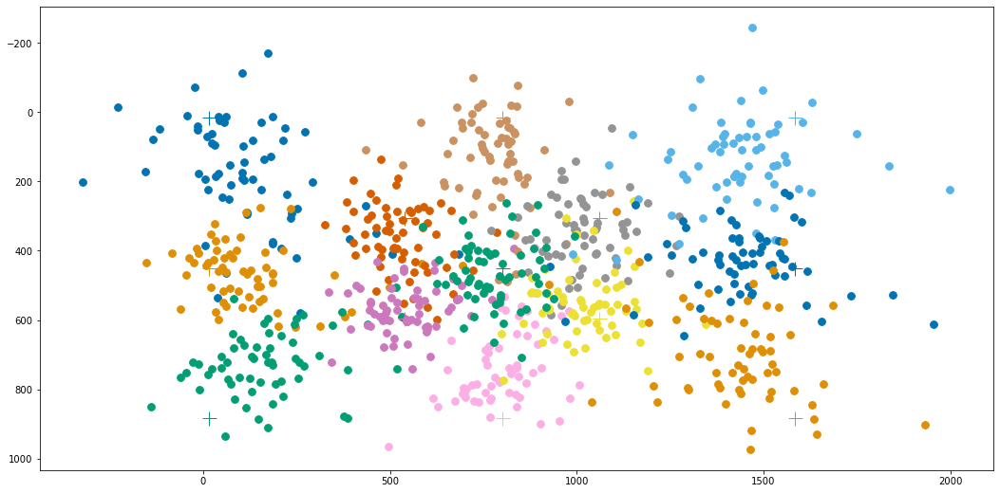

In [41]:
ax = fix_plot(fix_analyse.gt_points, df, kind = 'all_subjects')
plt.gca().invert_yaxis()
ax.plot()

[]

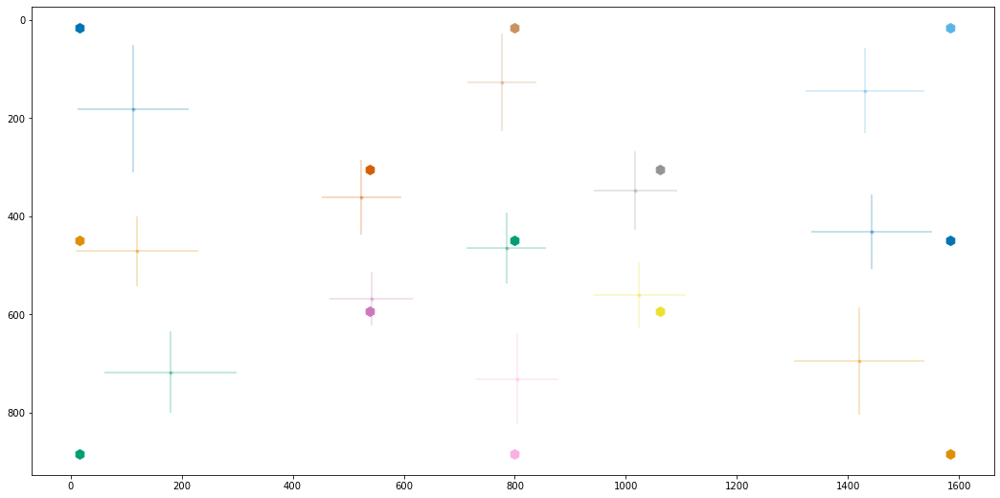

In [58]:
ax = fix_plot(fix_analyse.gt_points, df, kind = 'err')
plt.gca().invert_yaxis()
ax.plot()

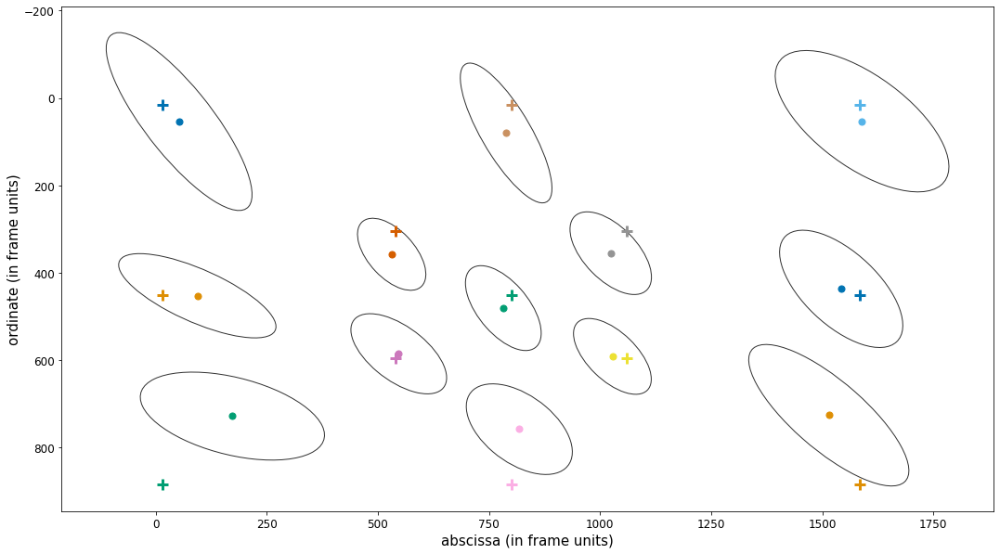

In [10]:
ax = fix_plot([(16, 16), (16, 450), (16, 884), (539, 305), (539, 595), (800, 16), (800, 884), (1061, 305), (1061, 595), (1584, 16), (1584, 450), (1584, 884), (800, 450)], df_eth,figsize=(18,10), kind = 'ellipse')
plt.gca().invert_yaxis()
ax.set_xlabel("abscissa (in frame units)", fontsize=15)
ax.set_ylabel("ordinate (in frame units)", fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=12)
# ax.set_yticklabels(fontsize=14)
ax.plot()
plt.savefig("fixation_41.png")

[]

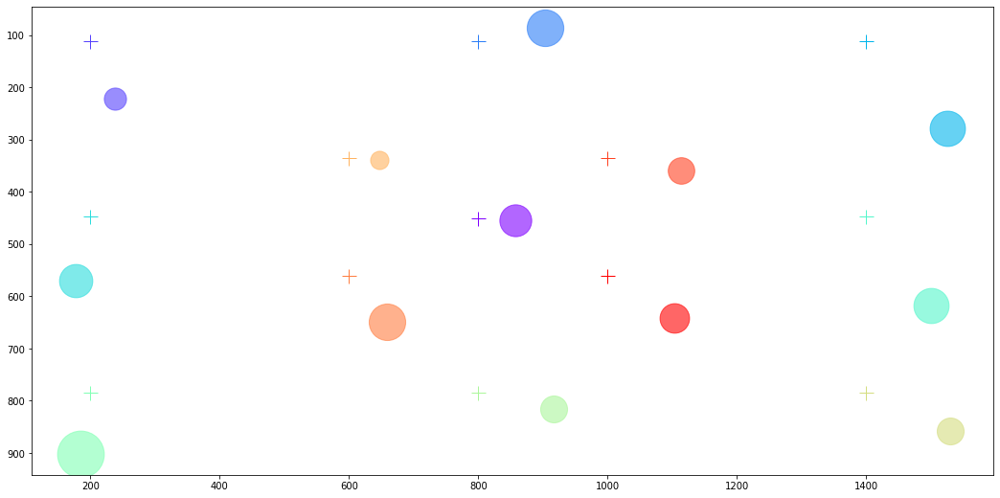

In [ ]:
pallete = iter(sns.color_palette('colorblind',13))
plt.figure(figsize=(18,9))
for i in range(13):
    gt = fix_analyse.gt_points[i]
    c = next(pallete)
    xs = winsorize(df['mean_x'].apply( lambda x: x[key+1] ), limits=[0.1,0.1]) 
    ys = winsorize(df['mean_y'].apply( lambda y: y[key+1] ), limits=[0.1,0.1])
    dist = [get_dist((x,y),(gt[0],gt[1])) for x,y in zip(xs,ys)]
    size = statistics.stdev([get_dist((x,y),(X,Y)) for x,y in zip(trial_x[i],trial_y[i])])
    plt.plot(X,Y,marker = "o", markersize = size, color = c, alpha = 0.6)
    plt.plot(pt[0],pt[1],marker="+", markersize = 15, color = c)

plt.gca().invert_yaxis()
plt.plot()

### ETHXGaze

In [77]:
paths = glob.glob(os.path.join(pred_path.ETH.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
df = subject_wise(subjects, pred_path.ETH) 

  0%|          | 0/63 [00:00<?, ?it/s]

s64 adding nan to pt 13 trial 12
s24 adding nan to pt 10 trial 7


[]

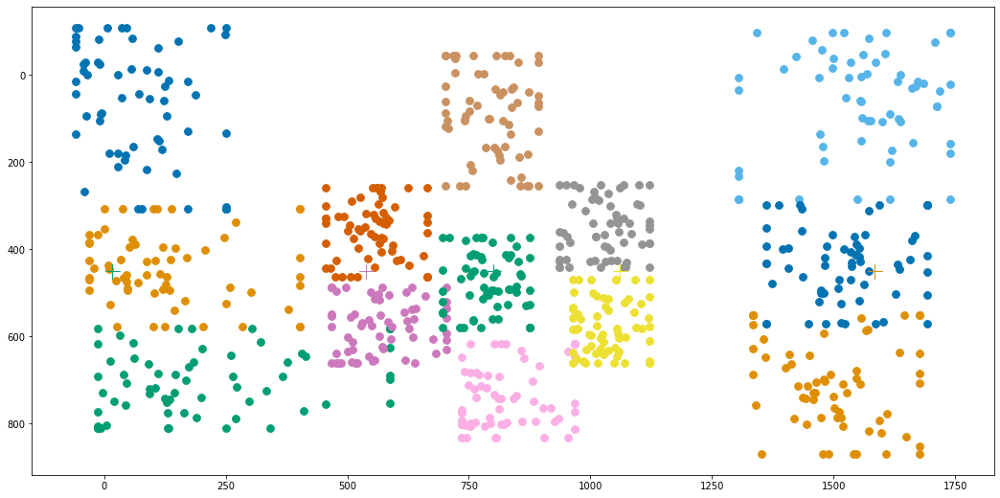

In [87]:
ax = fix_plot(fix_analyse.gt_points, df, kind = 'all_subjects')
plt.gca().invert_yaxis()
ax.plot()

[]

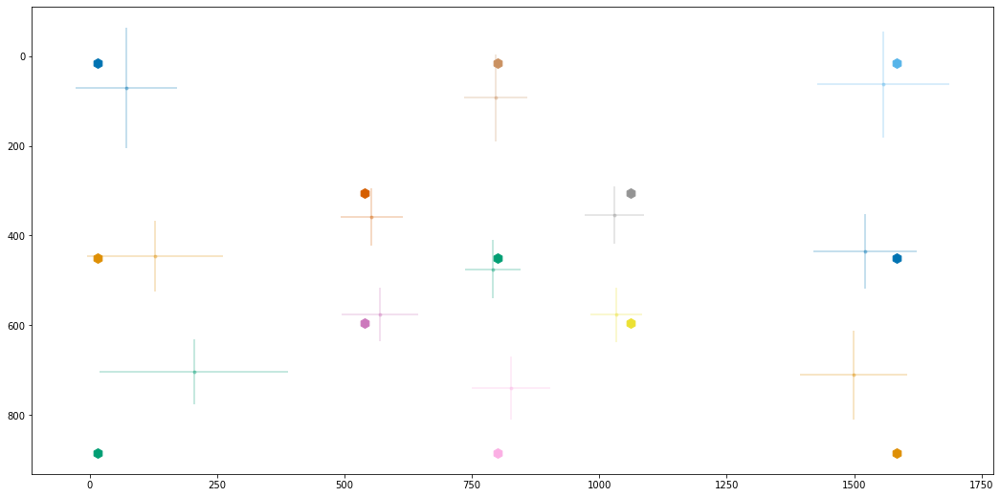

In [88]:
ax = fix_plot(fix_analyse.gt_points, df, kind = 'err')
plt.gca().invert_yaxis()
ax.plot()

[]

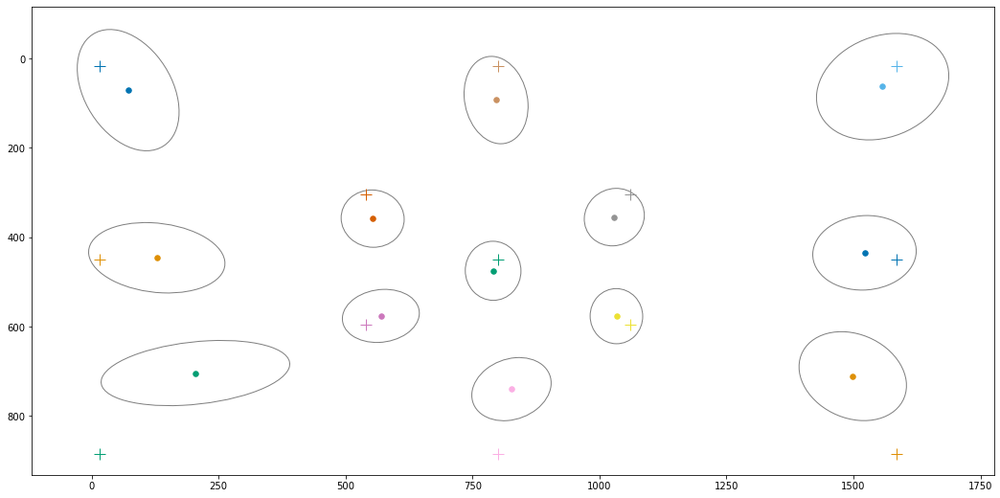

In [89]:
ax = fix_plot(fix_analyse.gt_points, df, kind = 'ellipse')
plt.gca().invert_yaxis()
ax.plot()

### Between comparisons

In [151]:
def plot_err(dfs, col, labels):
    palette = sns.color_palette('colorblind',5)
    plt.figure(figsize=(12,8))
    err_l, err_h, mean = [],[], []
    for df, x_tick in zip(dfs, np.linspace(1,5,len(dfs))):
        plt.scatter([x_tick]*df.shape[0] ,df[col], color = palette[2], alpha = 0.3)
        mean.append(df[col].mean())
#         err.append(np.std(df[col], ddof=1)/np.sqrt(df.shape[0]))
        err_l.append(df[col].quantile(0.025)- df[col].mean())
        err_h.append(df[col].quantile(0.975))

    plt.errorbar(np.linspace(1.5,4.5,len(dfs)),[df[col].mean(), df[col].mean()], err, linestyle = 'none', color = palette[4], linewidth=2, marker = 'o')
    plt.xlim(0,6)
    plt.xticks(np.linspace(1,5,len(dfs)),labels)
    plt.ylim(-100,800)
    plt.show()

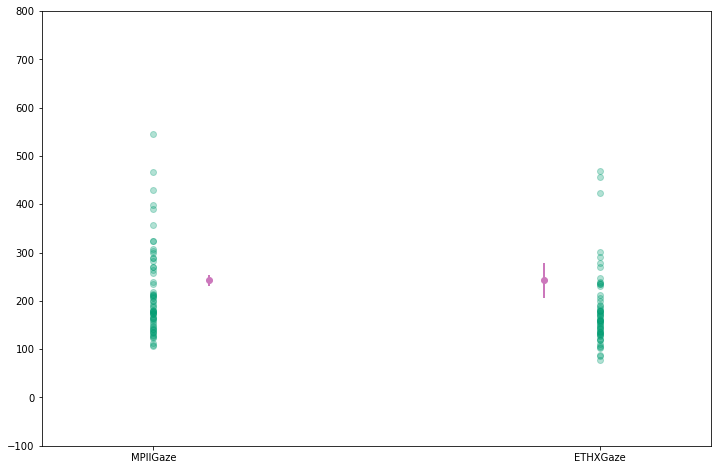

In [152]:
plot_err([df_mpii, df_eth],'acc', labels=["MPIIGaze","ETHXGaze"])

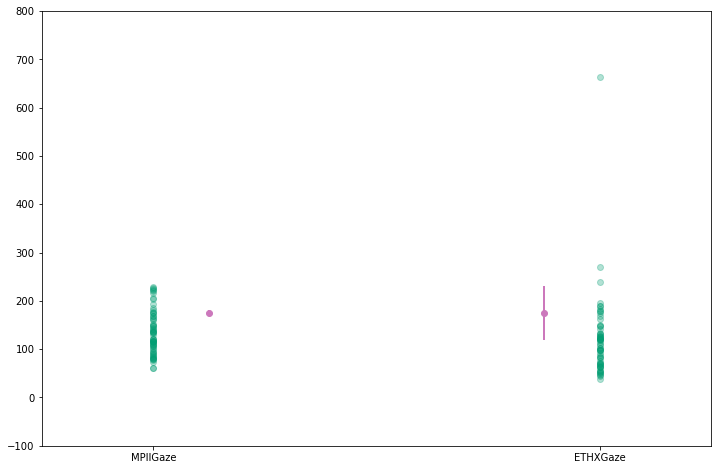

In [153]:
plot_err([df_mpii, df_eth],'rms', labels=["MPIIGaze","ETHXGaze"])

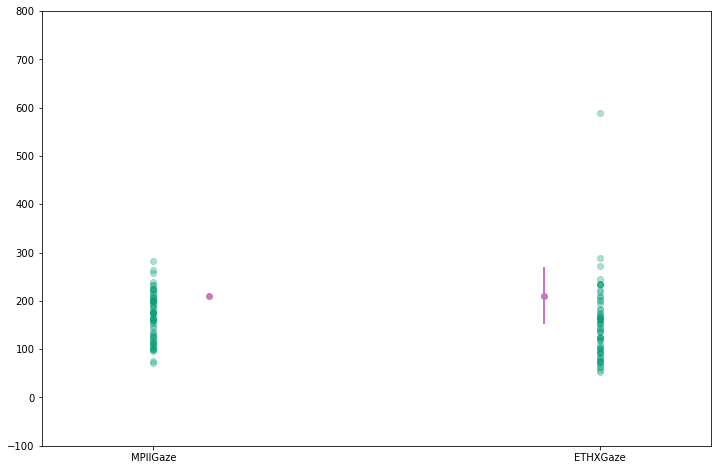

In [154]:
plot_err([df_mpii, df_eth],'std', labels=["MPIIGaze","ETHXGaze"])

# Smooth Pursuit

In [26]:
##test
SP_analyse = Smooth_Pursuit("s55", show=False)
# trial_x,trial_y,onsets = SP_analyse.parse_trials(pred_path.MPII, show = True)

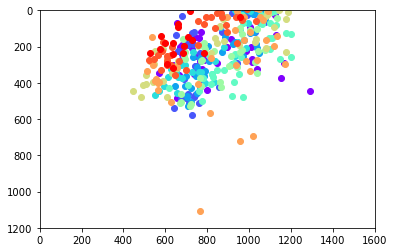

In [ ]:
##test
color = iter(cm.rainbow(np.linspace(0,1,10)))
for i in range(10):
    plt.scatter(trial_x[60][i],trial_y[60][i],color = next(color))
plt.xlim(0,1600)
plt.ylim(0,1200)
plt.gca().invert_yaxis()

In [94]:
##nvm
# angles =[i for i in SP_analyze.angles]
# center = [800,450]
# from IPython.display import display, clear_output
# pts = []
# for angle in angles:
#     X = center[0]+(450*np.cos(angle*np.pi/180))
#     Y = center[1]+(450*np.sin(angle*np.pi/180))
#     pts.append((X,Y))
#     plt.plot([center[0],X],[center[1],Y])
#     plt.xlim(0,1600)
#     plt.ylim(0,900)
#     plt.pause(0.6)
#     clear_output()

In [16]:
from scipy.stats import circmean as cim, circstd as cis
from sklearn.linear_model import LinearRegression

def process_trials(trial_x, trial_y, angles, show = False):
    avg = {k:[] for k in angles}
    for angle in trial_x.keys():
        for trial in range(10):
#             sm_x = savgol_filter(trial_x[angle][trial], 7, 1)
#             sm_y = savgol_filter(trial_y[angle][trial], 7, 1)
            if trial_x[angle][trial].shape[0] < 15: #Handling with min trial sample = window_size
                continue
            #rolling mean
            sm_x = trial_x[angle][trial].rolling(15).mean().dropna()
            sm_y = trial_y[angle][trial].rolling(15).mean().dropna()
            
            model = LinearRegression()
            X = np.array(sm_x).reshape(-1,1)
            Y = sm_y
            model.fit(X,Y)
            pred = model.predict(X)                                 
            
            math.degrees(math.atan(model.coef_))
            ang = np.rad2deg(np.arctan2(pred[-1] - pred[0], X[-1] - X[0])) 
            ang = -ang if ang<0 else 360-ang #invert y-axis
            
            if show:                
                plt.scatter(X,Y)
                plt.scatter(trial_x[angle][trial], trial_y[angle][trial], color = "black")
                plt.plot(X,pred, color = "orange")
                plt.gca().invert_yaxis()
                plt.show()
                print("ang ",ang)
            avg[angle].append(ang[0])
    return avg

In [17]:
def mean_angle_preds(trial_x,trial_y, angles, show= False):
    reg_angles = process_trials(trial_x,trial_y, angles)#, show=True)
    cmean,diff,cstd = {},{},{}
    for angle in angles:
        win_angles = circ_winsorize(reg_angles[angle],angle) #winsorize around ref angle
        cmean[angle] = cim(win_angles, high=360, low=0) #Filter Outliers ? trimmed mean oder std rule.... update: implemented circ winsorize
        diff[angle] = abs(cmean[angle]-angle) #only magnitude
        cstd[angle] = cis(win_angles, high=360, low=0)
        if show:
            print("*"*50)
            print("angle: ",angle)
            print("orig: ",np.int64(reg_angles[angle]))
            print("wins: ",np.int64(win_angles))
            print("diff: ", diff[angle] if diff[angle]<180 else 360-diff[angle])
            print("mean: ", cmean[angle])
            print("orig mean: ",cim(reg_angles[angle], high=360, low=0))
            print("stdv: ", cstd[angle])
    return cmean,diff,cstd

In [18]:
def subject_wise(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y","onsets", "cmean","diff","cstd"])
    for subb in tqdm(subjects):
        SP_analyse = Smooth_Pursuit(subb, show=False)
        trial_x,trial_y,onsets = SP_analyse.parse_trials(model, show = False)
        cmean, diff, cstd = mean_angle_preds(trial_x,trial_y, SP_analyse.angles)
        
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "onsets": onsets,"cmean":cmean ,"diff":diff, "cstd":cstd}, ignore_index = True)
    return df

### For each Model

In [6]:
# low_fps_subb = ['s69', 's65', 's22', 's14', 's50', 's35', 's54', 's70', 's26',
#        's15', 's45', 's74', 's51', 's72', 's24', 's33', 's42', 's10',
#        's57', 's62'] 

In [20]:
model = pred_path.MPII
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
SP_df = subject_wise(subjects, model)

 39%|████████████████▊                          | 16/41 [05:29<08:39, 20.77s/it]

Empty list cannot be interpolated
s64 adding nan to pt 60 trial 10
Empty list cannot be interpolated
s64 adding nan to pt 90 trial 11


 41%|█████████████████▊                         | 17/41 [05:48<08:04, 20.17s/it]

Empty list cannot be interpolated
s9 adding nan to pt 90 trial 3


 88%|█████████████████████████████████████▊     | 36/41 [11:56<01:33, 18.64s/it]

Empty list cannot be interpolated
s55 adding nan to pt 180 trial 5
Empty list cannot be interpolated
s55 adding nan to pt 150 trial 7
Empty list cannot be interpolated
s55 adding nan to pt 330 trial 8


100%|███████████████████████████████████████████| 41/41 [13:39<00:00, 19.98s/it]


In [21]:
model = pred_path.ETH
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
SP_df_eth = subject_wise(subjects, model)

 32%|█████████████▋                             | 13/41 [03:43<07:50, 16.79s/it]

float division by zero
s9 adding nan to pt 90 trial 3


 44%|██████████████████▉                        | 18/41 [05:10<06:44, 17.61s/it]

Empty list cannot be interpolated
s55 adding nan to pt 210 trial 3
Empty list cannot be interpolated
s55 adding nan to pt 300 trial 4
Empty list cannot be interpolated
s55 adding nan to pt 180 trial 5
Empty list cannot be interpolated
s55 adding nan to pt 90 trial 6
Empty list cannot be interpolated
s55 adding nan to pt 150 trial 7
Empty list cannot be interpolated
s55 adding nan to pt 330 trial 8


 59%|█████████████████████████▏                 | 24/41 [06:54<04:51, 17.15s/it]

Empty list cannot be interpolated
s64 adding nan to pt 60 trial 10
Empty list cannot be interpolated
s64 adding nan to pt 90 trial 11


100%|███████████████████████████████████████████| 41/41 [12:18<00:00, 18.00s/it]


In [22]:
model = pred_path.FAZE
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
SP_df_faze = subject_wise(subjects, model)

0it [00:00, ?it/s]


In [154]:
SP_cmeans = SP_df.cmean.apply(pd.Series)
SP_diffs = SP_df['diff'].apply(pd.Series)
SP_cstds = SP_df.cstd.apply(pd.Series)
SP_onsets = SP_df.onsets.apply(pd.Series)

In [155]:
#cmeans 
win_sub_cmean = {}
win_sub_cse = {}
win_sub_025 = {}
win_sub_975 = {}
for col in SP_cmeans.columns:
    win_means = circ_winsorize(SP_cmeans[col],col)
    win_sub_cmean[col] = cim(win_means, high=360, low=0) #winsorize circular mean
    if col==0 and win_sub_cmean[col]>180:
        win_sub_cmean[col] = win_sub_cmean[col] - 360
    win_sub_cse[col] = cis(win_means, high=360, low=0)/math.sqrt(SP_cmeans.shape[0]) #winsorize circular std
    
    win_means = np.array([x-360 if x-col > 180 else x for x in win_means])
    win_sub_025[col] = win_sub_cmean[col] - np.quantile(win_means, 0.025)
    win_sub_975[col] = np.quantile(win_means, 0.975) - win_sub_cmean[col]

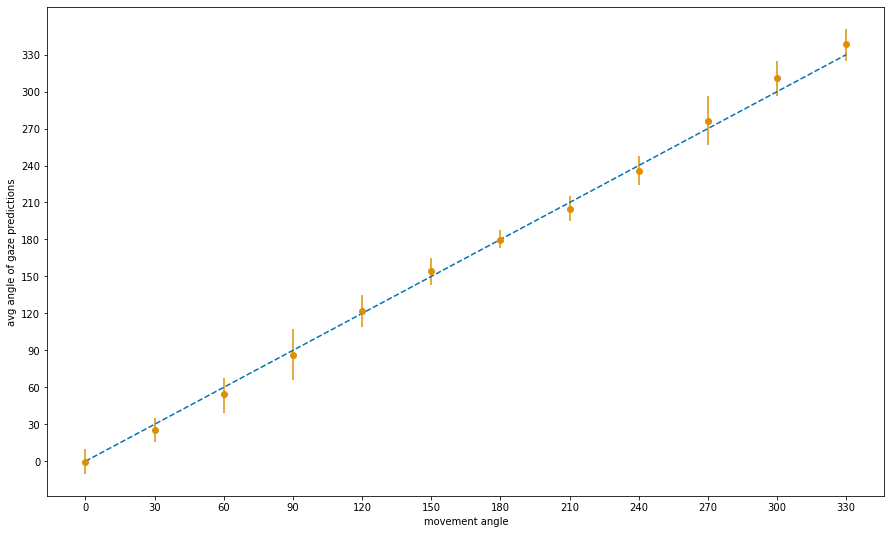

In [151]:
plt.figure(figsize=(15,9))
palette = iter(sns.color_palette('colorblind',12))
# SE STD or CI ? stdev only for normal dist otherwise misleading
# for _,row in SP_cmeans.iterrows():
#     row[0] = row[0] - 360 if row[0]>180 else row[0]
#     row[330] = row[330] + 360 if row[330]>360 else row[330]
#     plt.plot(row, alpha = 0.4, color = next(palette), marker = '.')
plt.plot([0,330],[0,330],linestyle="--", color = next(palette))
# plt.scatter(SP_analyse.angles,win_sub_cmean.values())
#Confidence interval for error bars

plt.errorbar(SP_analyse.angles,win_sub_cmean.values(), yerr = [list(win_sub_025.values()), list(win_sub_975.values())], linestyle = "None", marker="o", color = next(palette))

plt.xticks(SP_analyse.angles)
plt.yticks(SP_analyse.angles)
plt.xlabel("movement angle")
plt.ylabel("avg angle of gaze predictions")
plt.show()

In [153]:
cmean_eth = win_sub_cmean
cse_eth = win_sub_cse

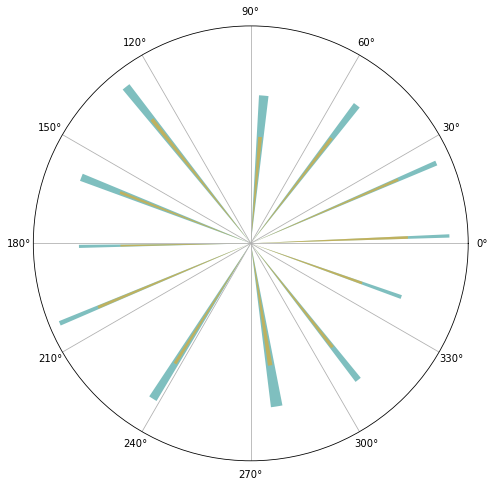

In [159]:
# ALL three models?
plt.figure(figsize=(8,8))
N = len(win_sub_cmean)
theta = [math.radians(i) for i in list(win_sub_cmean.values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
radii = np.random.uniform(low=7, high=10, size=N)
# width = np.pi / 32 * np.fromiter(win_sub_cse.values(), float)
width = [math.radians(i) for i in list(win_sub_cse.values())]
# colors = sns.color_palette("colorblind",len(win_sub_cmean))

ax = plt.subplot(projection='polar')
ax.bar(theta, radii, width=width, bottom=0.0, color="teal", alpha=0.5)
ax.set_rticks([])
ax.set_xticks([math.radians(i) for i in SP_analyse.angles])
# plt.show()

theta_eth = [math.radians(i) for i in list(cmean_eth.values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
width = [math.radians(i) for i in list(cse_eth.values())]

# ax = plt.subplot(projection='polar')
ax.bar(theta, radii-2, width=width, bottom=0.0, color="orange", alpha=0.5)
ax.set_rticks([])
ax.set_xticks([math.radians(i) for i in SP_analyse.angles])
plt.show()

### Temporal (ignore)

In [ ]:
# !pip install dtw
from dtw import dtw, accelerated_dtw
def dtw_dist(d1,d2):
    d, cost_matrix, acc_cost_matrix, path = accelerated_dtw(d1,d2, dist='euclidean')

#     plt.imshow(acc_cost_matrix.T, origin='lower', cmap='gray', interpolation='nearest')
#     plt.plot(path[0], path[1], 'w')
#     plt.xlabel('Subject1')
#     plt.ylabel('Subject2')
#     plt.title(f'DTW Minimum Path with minimum distance: {np.round(d,2)}')
#     plt.show()
    return d

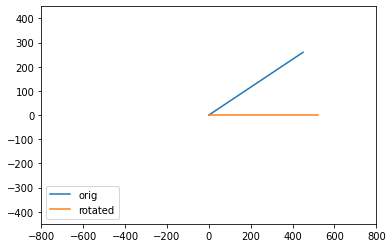

In [590]:
##test 
cos = math.cos(math.radians(30))
sin = math.sin(math.radians(30))
R = np.array([[cos,sin],[-sin,cos]])
pts_x = np.linspace(0,450,451)
pts_y = [i*math.tan(math.radians(30)) for i in pts_x]
plt.plot(pts_x,pts_y,label = "orig")
pts = np.row_stack([pts_x,pts_y])

res = np.matmul(R,pts)
plt.plot(res[0,:],res[1,:], label = "rotated")
plt.xlim(-800,800)
plt.ylim(-450,450)
plt.legend(loc=3)

In [606]:
#velocity
trial_y[150][0].diff()/trial_x[150][0].diff()

In [201]:
def rotate_axis(pts, theta):
    cos = math.cos(math.radians(theta))
    sin = math.sin(math.radians(theta))
    R = np.array([[cos,sin],[-sin,cos]])
    return np.matmul(R,pts)

for angle in SP_analyze.angles:
    for trial in range(10):
        X = trial_x[angle][trial]
        Y = trial_y[angle][trial]
        res = rotate_axis(np.row_stack([X,Y]),angle)
        print("angle: {}, trial {} ".format(angle,trial),dtw_dist(np.arange(0,res[0,:].max()), res[0,:]))
    print("*"*50)

NameError: name 'dtw_dist' is not defined

# Zone Classification

In [183]:
import ffmpeg   

# def plot_zone(x,y,c):
#     plt.plot(x,y,marker="o", markersize = 15,color = c)
#     plt.xlim(0,1600)
#     plt.ylim(0,900)
#     plt.xticks([400,800,1200])
#     plt.yticks([225,450,675])
#     plt.grid("both", markevery = (5,3))
#     plt.gca().invert_yaxis()
    
def plot_zone(grid_size):
    plt.xlim(0,1600)
    plt.ylim(0,900)
    plt.xticks([(i+1)*1600//grid_size[0] for i in range(grid_size[0])])
    plt.yticks([(i+1)*900//grid_size[1] for i in range(grid_size[1])])
    plt.grid("both")
    plt.gca().invert_yaxis()

In [190]:
zone_analyze = Zone_Classification("s8", show=True)

did_leave_fullscreen                                                  0.0
FrameEnd                                                  1635887817914.0
FrameStart                                                1635887788015.0
iteration                                                            18.0
pos_hide_time           "times=1635887787968;1635887789531;16358877912...
pos_update_time         "times=1635887787968;1635887789728;16358877914...
recordZone                 blockNr_13_taskNr_12_trialNr_1_recordZone.webm
RecStart                                                              5.0
RecStop                                                           28773.0
seq                                15;10;13;8;5;16;1;14;12;6;4;3;2;7;11;9
Name: 14, dtype: object
sp_df summary 
 None


Recording length :  28.687000
RecStop - RecStart :  28768.0
Total Frame Count :  870
FPS :  0.03024193548387097
start times :  [1712, 3431, 5128, 6832, 8526, 10227, 11927, 13642, 15342, 17046, 18743, 20442, 22164, 23856, 25558, 27272]
stop times :  [3211, 4927, 6627, 8326, 10026, 11725, 13425, 15141, 16842, 18540, 20240, 21956, 23656, 25355, 27072, 28785]
diff :  [1499, 1496, 1499, 1494, 1500, 1498, 1498, 1499, 1500, 1494, 1497, 1514, 1492, 1499, 1514, 1513]


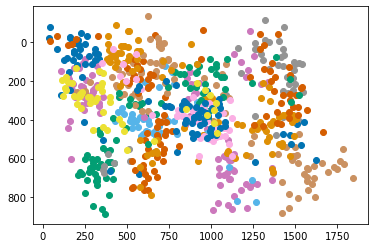

--------------------------------------------------
Recording length :  28.684000
RecStop - RecStart :  28763.0
Total Frame Count :  874
FPS :  0.030386260125856136
start times :  [1718, 3413, 5109, 6825, 8534, 10224, 11928, 13640, 15343, 17040, 18755, 20438, 22148, 23839, 25555, 27270]
stop times :  [3209, 4909, 6609, 8308, 10024, 11724, 13440, 15140, 16839, 18539, 20238, 21940, 23637, 25354, 27054, 28785]
diff :  [1491, 1496, 1500, 1483, 1490, 1500, 1512, 1500, 1496, 1499, 1483, 1502, 1489, 1515, 1499, 1515]


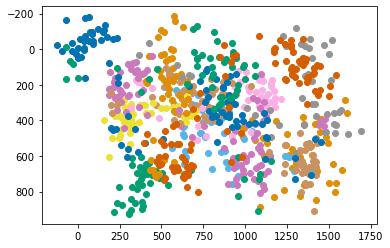

--------------------------------------------------
Recording length :  28.658000
RecStop - RecStart :  28755.0
Total Frame Count :  869
FPS :  0.030220831159798296
start times :  [1716, 3415, 5114, 6830, 8531, 10231, 11929, 13629, 15345, 17044, 18745, 20445, 22144, 23843, 25542, 27243]
stop times :  [3216, 4915, 6630, 8331, 10030, 11729, 13429, 15128, 16844, 18544, 20244, 21943, 23643, 25353, 27042, 28763]
diff :  [1500, 1500, 1516, 1501, 1499, 1498, 1500, 1499, 1499, 1500, 1499, 1498, 1499, 1510, 1500, 1520]


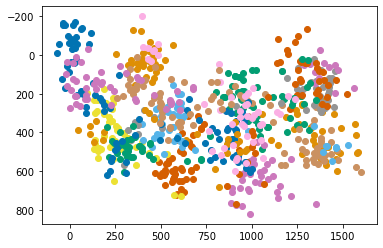

--------------------------------------------------
Recording length :  28.751000
RecStop - RecStart :  28764.0
Total Frame Count :  875
FPS :  0.0304199694062022
start times :  [1718, 3418, 5120, 6835, 8517, 10234, 11942, 13655, 15349, 17048, 18748, 20447, 22146, 23846, 25552, 27262]
stop times :  [3221, 4918, 6617, 8316, 10017, 11732, 13432, 15131, 16848, 18547, 20247, 21955, 23646, 25345, 27045, 28771]
diff :  [1503, 1500, 1497, 1481, 1500, 1498, 1490, 1476, 1499, 1499, 1499, 1508, 1500, 1499, 1493, 1509]


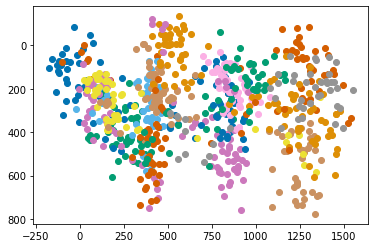

--------------------------------------------------
Recording length :  28.697000
RecStop - RecStart :  28748.0
Total Frame Count :  870
FPS :  0.03026297481563935
start times :  [1710, 3410, 5110, 6826, 8516, 10224, 11925, 13623, 15323, 17024, 18722, 20438, 22138, 23841, 25539, 27253]
stop times :  [3209, 4909, 6609, 8308, 10024, 11724, 13424, 15123, 16822, 18522, 20239, 21938, 23638, 25337, 27059, 28762]
diff :  [1499, 1499, 1499, 1482, 1508, 1500, 1499, 1500, 1499, 1498, 1517, 1500, 1500, 1496, 1520, 1509]


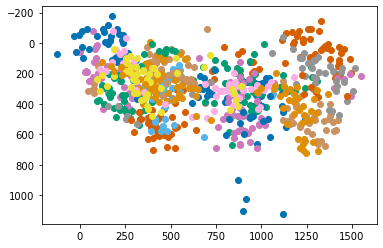

--------------------------------------------------
Recording length :  28.655000
RecStop - RecStart :  28724.0
Total Frame Count :  873
FPS :  0.0303927029661607
start times :  [1708, 3410, 5112, 6809, 8525, 10223, 11923, 13622, 15322, 17021, 18720, 20420, 22120, 23820, 25520, 27235]
stop times :  [3207, 4907, 6606, 8307, 10022, 11722, 13422, 15122, 16821, 18521, 20220, 21920, 23620, 25319, 27018, 28745]
diff :  [1499, 1497, 1494, 1498, 1497, 1499, 1499, 1500, 1499, 1500, 1500, 1500, 1500, 1499, 1498, 1510]


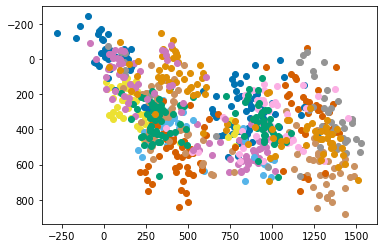

--------------------------------------------------
Recording length :  28.640000
RecStop - RecStart :  28729.0
Total Frame Count :  869
FPS :  0.03024818128023948
start times :  [1711, 3409, 5109, 6825, 8524, 10224, 11923, 13623, 15323, 17022, 18724, 20423, 22121, 23820, 25538, 27237]
stop times :  [3209, 4909, 6610, 8324, 10024, 11723, 13423, 15123, 16822, 18522, 20221, 21921, 23621, 25320, 27036, 28747]
diff :  [1498, 1500, 1501, 1499, 1500, 1499, 1500, 1500, 1499, 1500, 1497, 1498, 1500, 1500, 1498, 1510]


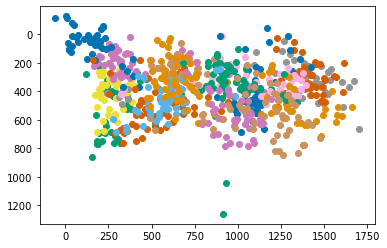

--------------------------------------------------
Recording length :  28.696000
RecStop - RecStart :  28727.0
Total Frame Count :  875
FPS :  0.030459149928638563
start times :  [1708, 3408, 5110, 6809, 8523, 10222, 11922, 13621, 15321, 17021, 18720, 20420, 22121, 23835, 25535, 27235]
stop times :  [3208, 4907, 6606, 8323, 10023, 11722, 13421, 15122, 16821, 18520, 20219, 21919, 23619, 25335, 27034, 28747]
diff :  [1500, 1499, 1496, 1514, 1500, 1500, 1499, 1501, 1500, 1499, 1499, 1499, 1498, 1500, 1499, 1512]


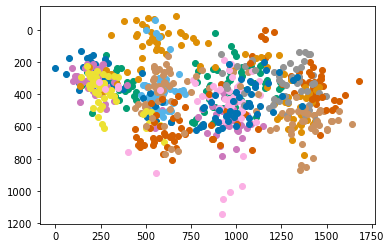

--------------------------------------------------
Recording length :  28.685000
RecStop - RecStart :  28725.0
Total Frame Count :  869
FPS :  0.030252393385552655
start times :  [1706, 3406, 5120, 6820, 8520, 10219, 11919, 13618, 15318, 17018, 18717, 20419, 22121, 23833, 25533, 27232]
stop times :  [3207, 4905, 6620, 8319, 10020, 11719, 13420, 15118, 16817, 18517, 20216, 21916, 23638, 25333, 27032, 28745]
diff :  [1501, 1499, 1500, 1499, 1500, 1500, 1501, 1500, 1499, 1499, 1499, 1497, 1517, 1500, 1499, 1513]


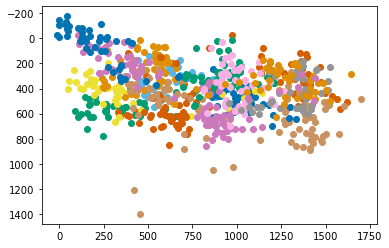

--------------------------------------------------
Recording length :  28.680000
RecStop - RecStart :  28727.0
Total Frame Count :  874
FPS :  0.03042433947157726
start times :  [1713, 3413, 5112, 6812, 8514, 10212, 11928, 13628, 15328, 17027, 18726, 20426, 22126, 23825, 25559, 27225]
stop times :  [3213, 4912, 6612, 8312, 10012, 11712, 13427, 15127, 16827, 18527, 20226, 21926, 23625, 25325, 27025, 28732]
diff :  [1500, 1499, 1500, 1500, 1498, 1500, 1499, 1499, 1499, 1500, 1500, 1500, 1499, 1500, 1466, 1507]


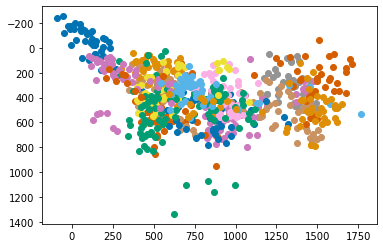

--------------------------------------------------


In [191]:
trial_x,trial_y = zone_analyze.parse_trials(pred_path.MPII)

In [261]:
def subject_wise(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y", "mean_x", "mean_y"])
    for subb in tqdm(subjects):
        zone_analyse = Zone_Classification(subb, show=False)
        trial_x,trial_y,mean_x,mean_y = zone_analyse.parse_trials(model, show = False)
#         cmean, diff, cstd = mean_angle_preds(trial_x,trial_y, SP_analyse.angles)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "mean_x": mean_x, "mean_y": mean_y}, ignore_index = True)
    return df

In [255]:
model = pred_path.MPII
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
Zone_df_mpii = subject_wise(subjects, model)

 41%|█████████████████▊                         | 17/41 [01:11<01:27,  3.64s/it]

s9 adding nan to zone 10 trial 7
{1: 662.8571428571429, 2: 866.6428571428571, 3: 892.5, 4: 1060.5714285714287, 5: 748.7857142857143, 6: 847.4285714285714, 7: 1117.2142857142858, 8: 1147.5, 9: 602.0714285714286, 10: nan, 11: 1026.2857142857142, 12: 1076.0, 13: 755.2142857142857, 14: 734.8571428571429, 15: 921.6428571428571, 16: 904.7857142857143} {1: 529.6428571428571, 2: 484.42857142857144, 3: 481.0, 4: 461.5, 5: 560.1428571428571, 6: 517.9285714285714, 7: 451.7857142857143, 8: 438.7142857142857, 9: 583.5, 10: nan, 11: 504.7142857142857, 12: 484.85714285714283, 13: 525.4285714285714, 14: 544.2142857142857, 15: 506.57142857142856, 16: 516.2142857142857}


/mnt/beegfs/users/shreshth.saxena/analysis_module.py:74: RuntimeWarning: invalid value encountered in double_scalars
  c = x//(1600//grid_size[0])
/mnt/beegfs/users/shreshth.saxena/analysis_module.py:75: RuntimeWarning: invalid value encountered in double_scalars
  r = y//(900//grid_size[1])


{1: 666.1875, 2: 892.25, 3: 930.5625, 4: 1098.75, 5: 749.3125, 6: 860.125, 7: 1116.1875, 8: 1152.0, 9: 634.625, 10: nan, 11: 1041.4375, 12: 1094.25, 13: 740.5625, 14: 763.4375, 15: 934.375, 16: 924.5} {1: 523.5, 2: 477.0, 3: 472.4375, 4: 453.875, 5: 553.3125, 6: 507.9375, 7: 449.6875, 8: 438.0, 9: 573.1875, 10: nan, 11: 494.4375, 12: 477.4375, 13: 525.8125, 14: 530.3125, 15: 499.0625, 16: 509.3125}
{1: 690.2222222222222, 2: 942.7777777777778, 3: 940.3888888888889, 4: 1140.2777777777778, 5: 766.0, 6: 912.2222222222222, 7: 1151.7222222222222, 8: 1178.0, 9: 671.6111111111111, 10: nan, 11: 1060.5555555555557, 12: 1108.6666666666667, 13: 774.8333333333334, 14: 810.6111111111111, 15: 954.2222222222222, 16: 960.0} {1: 516.1666666666666, 2: 467.72222222222223, 3: 468.44444444444446, 4: 443.72222222222223, 5: 542.8333333333334, 6: 494.8333333333333, 7: 441.3888888888889, 8: 432.94444444444446, 9: 559.3888888888889, 10: nan, 11: 483.8888888888889, 12: 470.44444444444446, 13: 518.1666666666666, 1

 46%|███████████████████▉                       | 19/41 [01:17<01:30,  4.10s/it]


KeyboardInterrupt: 

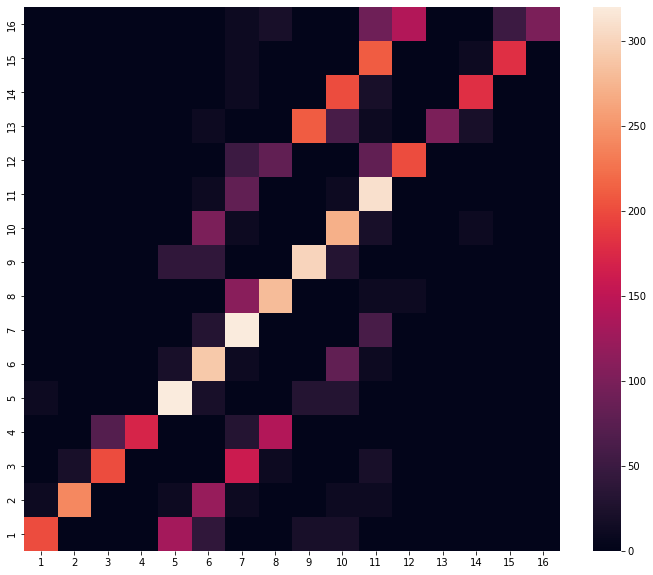

In [273]:
y_pred, y_true = [],[]
for i,row in Zone_df_mpii.iterrows():
    for k in range(1,17):
        y_pred.append(get_zone(row.mean_x[k], row.mean_y[k], (4,4))+1)
        y_true.append(k)
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_true,y_pred)

import seaborn as sns
plt.figure(figsize=(12,10))
sns.heatmap(conf_matrix*10, xticklabels=range(1,17), yticklabels=range(1,17))
plt.gca().invert_yaxis()

In [278]:
from sklearn import metrics
zone_pred = np.argmax(conf_matrix,axis=1)+1
metrics.accuracy_score(np.arange(1,17),zone_pred)*100

75.0

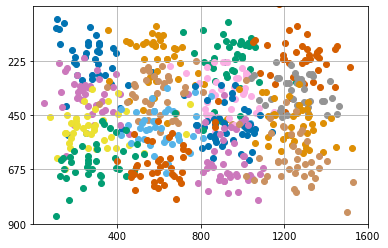

In [269]:
pallete = iter(sns.color_palette("colorblind", 16))
mx = Zone_df_mpii.mean_x.apply(pd.Series)
my = Zone_df_mpii.mean_y.apply(pd.Series)
plot_zone((4,4))
for zone in range(1,17):
    color = next(pallete)
    plt.scatter(mx[zone],my[zone],marker="o",color = color)
#     plt.show()
#     print("Zone {} : {}/10".format(zone,c))
    
# print("Avg: ",avg/160)

In [231]:
win_sub_x = Zone_df_mpii.mean_x.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)
win_sub_y = Zone_df_mpii.mean_y.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)

accuracy: 11/16 = 68.75%


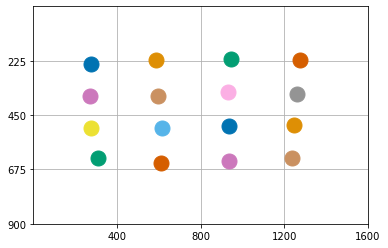

In [289]:
pallete = iter(sns.color_palette("colorblind",16))
c=0
plot_zone((4,4))
for z in range(1,17):
    plt.plot(win_sub_x[z],win_sub_y[z], marker="o", markersize = 15, color = next(pallete))
    if get_zone(win_sub_x[z],win_sub_y[z], (4,4)) == z-1:
        c+=1
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

accuracy: 16/16 = 100.00%


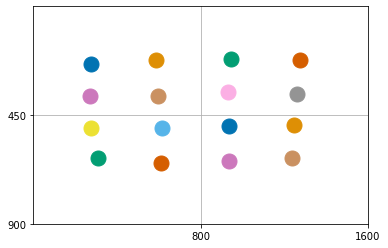

In [291]:
pallete = iter(sns.color_palette("colorblind",16))
c=0
gt = {0:[1,2,5,6],1:[3,4,7,8],2:[9,10,13,14],3:[11,12,15,16]}
plot_zone((2,2))
for z in range(1,17):
    plt.plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(2,2))]  else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

accuracy: 16/16 = 100.00%


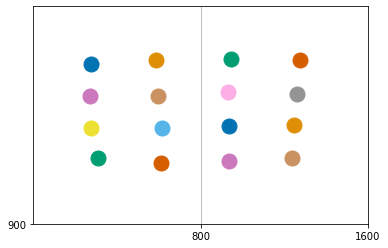

In [292]:
pallete = iter(sns.color_palette("colorblind",16))
c=0
gt = {0:[1,2,5,6,9,10,13,14],1:[3,4,7,8,11,12,15,16]}
plot_zone((2,1))
for z in range(1,17):
    plt.plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(2,1))] else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

accuracy: 16/16 = 100.00%


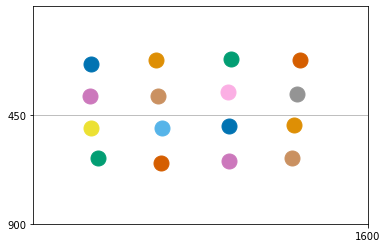

In [293]:
pallete = iter(sns.color_palette("colorblind",16))
c=0
gt = {0:[1,2,5,6,3,4,7,8],1:[9,10,13,14,11,12,15,16]}
plot_zone((1,2))
for z in range(1,17):
    av_x = statistics.mean(trial_x[z])
    av_y = statistics.mean(trial_y[z])
    plt.plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(1,2))//2] else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

# FreeView

In [435]:
# Ref:
# https://github.com/herrlich10/saliency/blob/master/benchmark/utils.py
# https://github.com/cvzoya/saliency/tree/master/code_forMetrics

def normalize(x, method='standard', axis=None):
    '''Normalizes the input with specified method.
    Parameters
    ----------
    x : array-like
    method : string, optional
        Valid values for method are:
        - 'standard': mean=0, std=1
        - 'range': min=0, max=1
        - 'sum': sum=1
    axis : int, optional
        Axis perpendicular to which array is sliced and normalized.
        If None, array is flattened and normalized.
    Returns
    -------
    res : numpy.ndarray
        Normalized array.
    '''
    # TODO: Prevent divided by zero if the map is flat
    x = np.array(x, copy=False)
    if axis is not None:
        y = np.rollaxis(x, axis).reshape([x.shape[axis], -1])
        shape = np.ones(len(x.shape))
        shape[axis] = x.shape[axis]
        if method == 'standard':
            res = (x - np.mean(y, axis=1).reshape(shape)) / np.std(y, axis=1).reshape(shape)
        elif method == 'range':
            res = (x - np.min(y, axis=1).reshape(shape)) / (np.max(y, axis=1) - np.min(y, axis=1)).reshape(shape)
        elif method == 'sum':
            res = x / np.float_(np.sum(y, axis=1).reshape(shape))
        else:
            raise ValueError('method not in {"standard", "range", "sum"}')
    else:
        if method == 'standard':
            res = (x - np.mean(x)) / np.std(x)
        elif method == 'range':
            res = (x - np.min(x)) / (np.max(x) - np.min(x))
        elif method == 'sum':
            res = x / float(np.sum(x))
        else:
            raise ValueError('method not in {"standard", "range", "sum"}')
    return res

def CC(saliency_map1, saliency_map2):
    '''
    Pearson's correlation coefficient between two different saliency maps
    (CC=0 for uncorrelated maps, CC=1 for perfect linear correlation).

    '''
    map1 = np.array(saliency_map1, copy=False)
    map2 = np.array(saliency_map2, copy=False)
    assert map1.shape == map2.shape, "Size of two maps do not match"
    # Normalize the two maps to have zero mean and unit std
    map1 = normalize(map1, method='standard')
    map2 = normalize(map2, method='standard')
    # Compute correlation coefficient
    return np.corrcoef(map1.ravel(), map2.ravel())[0,1]

def SIM(saliency_map1, saliency_map2):
    '''
    Similarity between two different saliency maps when viewed as distributions
    (SIM=1 means the distributions are identical).
    This similarity measure is also called **histogram intersection**.
    '''
    map1 = np.array(saliency_map1, copy=False)
    map2 = np.array(saliency_map2, copy=False)
    assert map1.shape == map2.shape, "Size of two maps do not match"
    # Normalize the two maps to have values between [0,1] and sum up to 1
    map1 = normalize(map1, method='range')
    map2 = normalize(map2, method='range')
    map1 = normalize(map1, method='sum')
    map2 = normalize(map2, method='sum')
    # Compute histogram intersection
    intersection = np.minimum(map1, map2)
    return np.sum(intersection)
 
def AUC_Judd(gray, x, y):
    gray = (gray-gray.min())/(gray.max() - gray.min()) ##normalize
    # fixation_map = gray>0.5
    xpts=x.explode(ignore_index=True).dropna().clip(0,gray.shape[1]-1) #clipping to boundary vals
    xpts = xpts - (1600 - img.shape[1])//2 #not generic but since all 16 images are resized on height
    ypts=y.explode(ignore_index=True).dropna().clip(0,gray.shape[0]-1)
    fixation_map = np.zeros(gray.shape, dtype = bool)
    fixation_map[ypts.astype(int),xpts.astype(int)] = True
    fixation_map[[0,0,gray.shape[0]-1,gray.shape[0]-1],[0,gray.shape[1]-1,0,gray.shape[1]-1]] = False #correcting for boundary values
    
    #from MIT saliency metrics Matlab/py (/herrlich10/saliency) implementation
    S = gray.ravel()
    F = fixation_map.ravel()
    S_fix = S[F]
    n_fix = len(S_fix)
    n_pixels = len(S)


    # Calculate AUC
    thresholds = sorted(S_fix, reverse=True)
    tp = np.zeros(len(thresholds)+2)
    fp = np.zeros(len(thresholds)+2)
    tp[0] = 0; tp[-1] = 1
    fp[0] = 0; fp[-1] = 1
    for k, thresh in enumerate(thresholds):
        above_th = np.sum(S >= thresh) # Total number of saliency map values above threshold
        tp[k+1] = (k + 1) / float(n_fix) # Ratio saliency map values at fixation locations above threshold
        fp[k+1] = (above_th - k - 1) / float(n_pixels - n_fix) # Ratio other saliency map values above threshold
    return np.trapz(tp, fp)

def std_2D(x,y):
    x_mean = int(statistics.mean(x))
    y_mean  = int(statistics.mean(y))
    d_mean=[]
    for i,j in zip(x,y):
        d_mean.append(distance.euclidean([x_mean,y_mean],[i,j]))
    return statistics.stdev(d_mean)

In [335]:
import analysis_module
from importlib import reload
reload(analysis_module)
from analysis_module import *

Recording length :  3.925000
RecStop - RecStart :  4002.0
Frame Count :  120
FPS :  0.029985007496251874
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_2_freeViewRec.webm
Trial_Id 8 image name i12030916


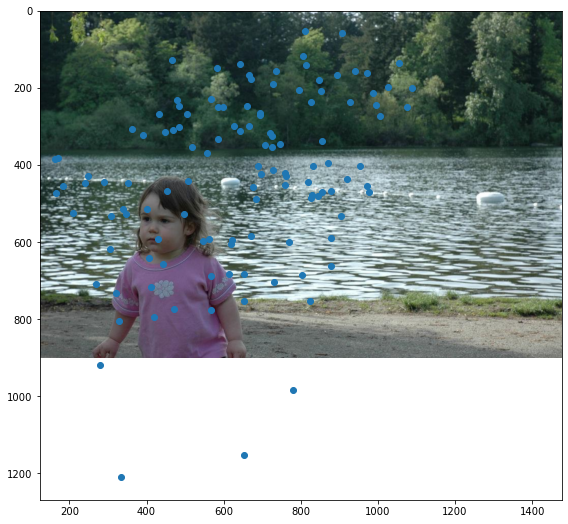

Recording length :  3.927000
RecStop - RecStart :  4003.0
Frame Count :  120
FPS :  0.029977516862353237
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_3_freeViewRec.webm
Trial_Id 5 image name i1142164052


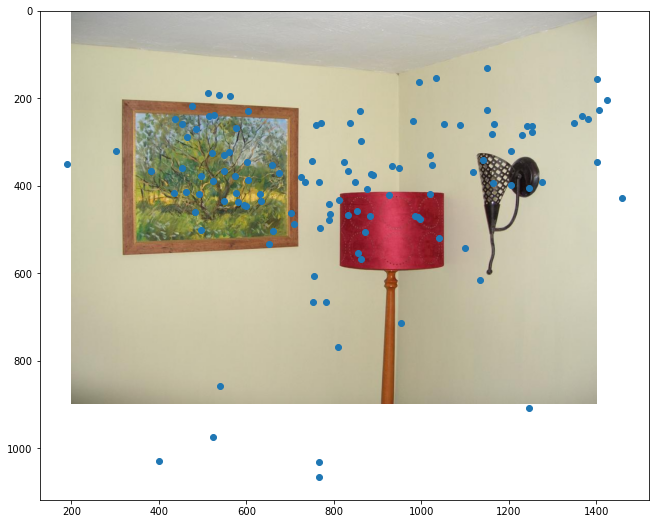

Recording length :  3.930000
RecStop - RecStart :  4003.0
Frame Count :  120
FPS :  0.029977516862353237
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_4_freeViewRec.webm
Trial_Id 13 image name i2057541


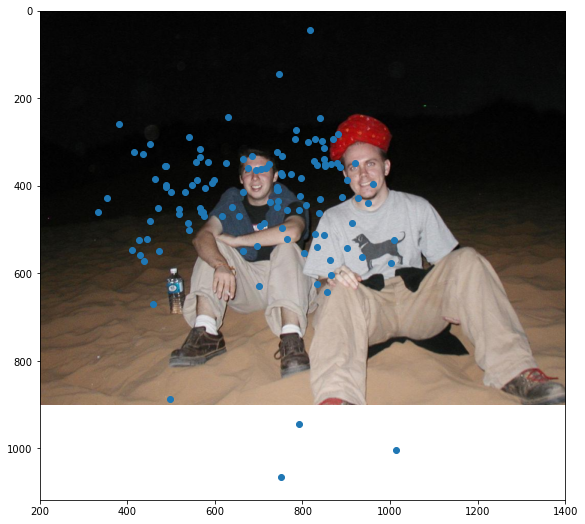

Recording length :  3.931000
RecStop - RecStart :  4003.0
Frame Count :  120
FPS :  0.029977516862353237
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_5_freeViewRec.webm
Trial_Id 9 image name i12049788


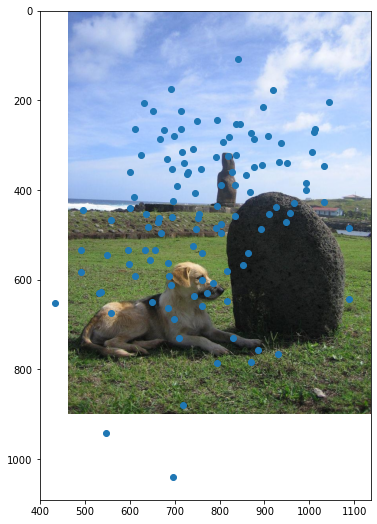

Recording length :  3.889000
RecStop - RecStart :  4005.0
Frame Count :  119
FPS :  0.02971285892634207
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_6_freeViewRec.webm
Trial_Id 10 image name i132419257


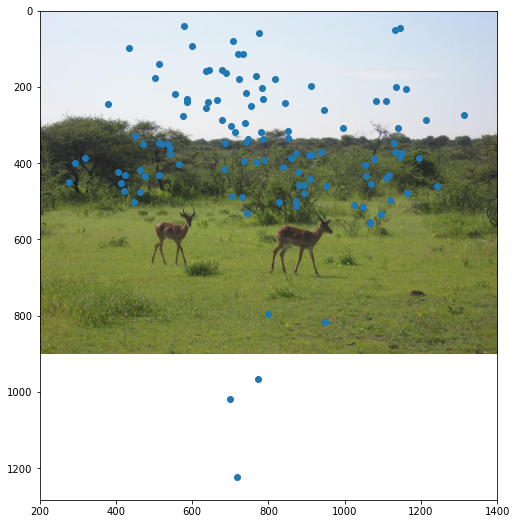

Recording length :  3.926000
RecStop - RecStart :  4002.0
Frame Count :  120
FPS :  0.029985007496251874
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_7_freeViewRec.webm
Trial_Id 11 image name i14020903


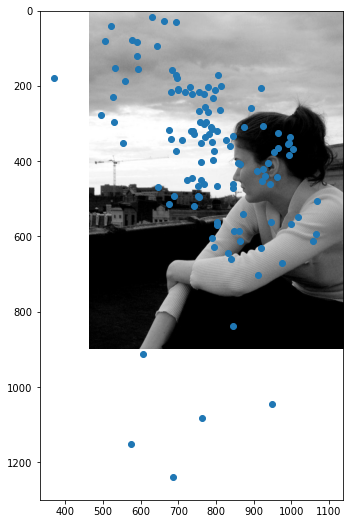

Recording length :  3.911000
RecStop - RecStart :  4003.0
Frame Count :  120
FPS :  0.029977516862353237
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_8_freeViewRec.webm
Trial_Id 1 image name i05june05_static_street_boston_p1010806


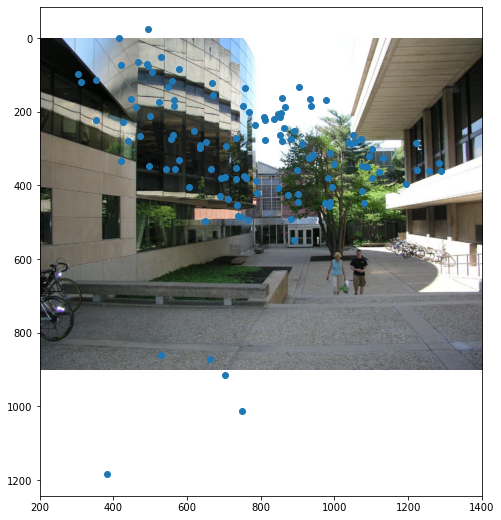

Recording length :  3.929000
RecStop - RecStart :  4005.0
Frame Count :  120
FPS :  0.0299625468164794
file name Subjects/s8/334789/blockNr_13_taskNr_6_trialNr_9_freeViewRec.webm
Trial_Id 16 image name i4466881


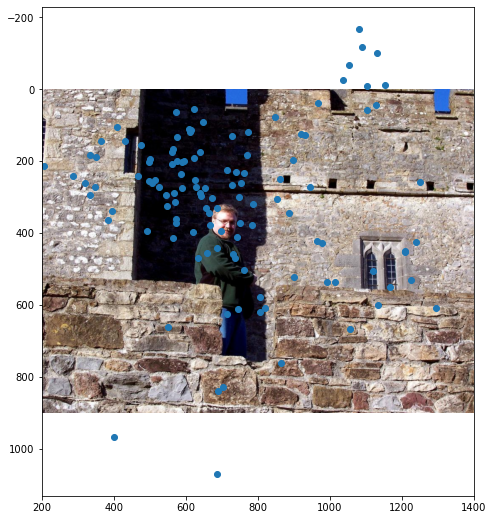

Recording length :  3.975000
RecStop - RecStart :  4004.0
Frame Count :  117
FPS :  0.02922077922077922
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_2_freeViewRec.webm
Trial_Id 12 image name i1508828


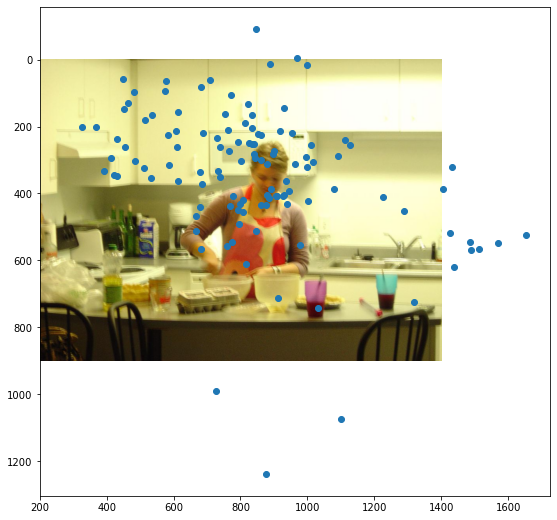

Recording length :  3.887000
RecStop - RecStart :  4004.0
Frame Count :  119
FPS :  0.02972027972027972
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_3_freeViewRec.webm
Trial_Id 3 image name i110996888


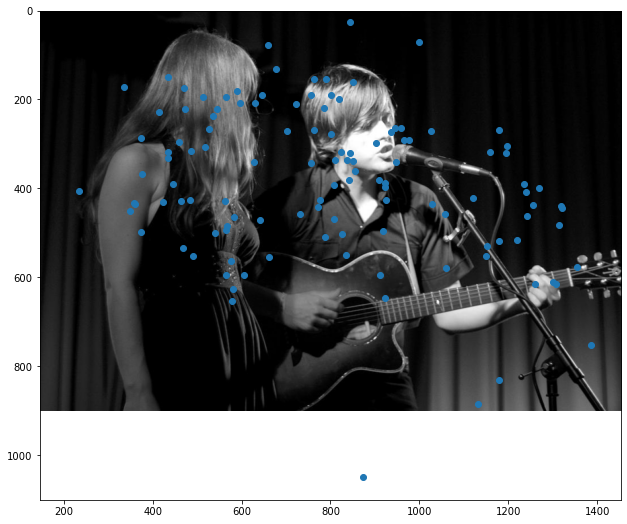

Recording length :  3.925000
RecStop - RecStart :  4003.0
Frame Count :  120
FPS :  0.029977516862353237
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_4_freeViewRec.webm
Trial_Id 15 image name i40576393


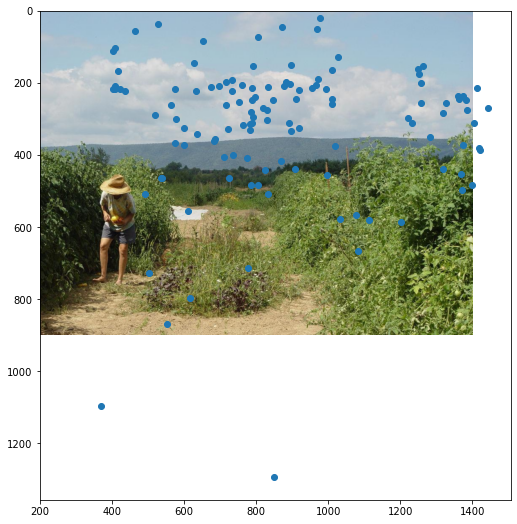

Recording length :  3.924000
RecStop - RecStart :  4003.0
Frame Count :  120
FPS :  0.029977516862353237
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_5_freeViewRec.webm
Trial_Id 2 image name i102423191


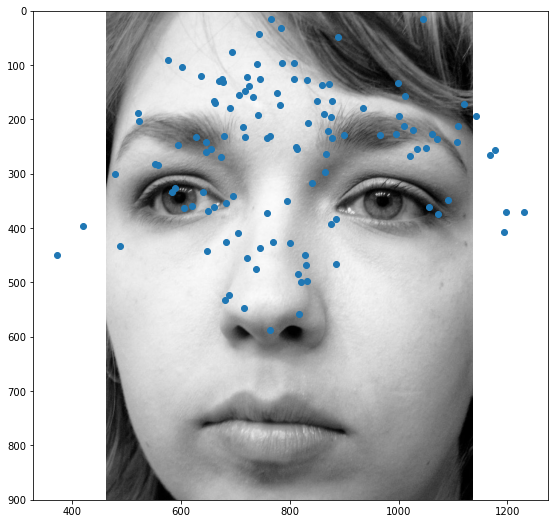

Recording length :  3.928000
RecStop - RecStart :  4010.0
Frame Count :  120
FPS :  0.029925187032418952
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_6_freeViewRec.webm
Trial_Id 14 image name i2234959271


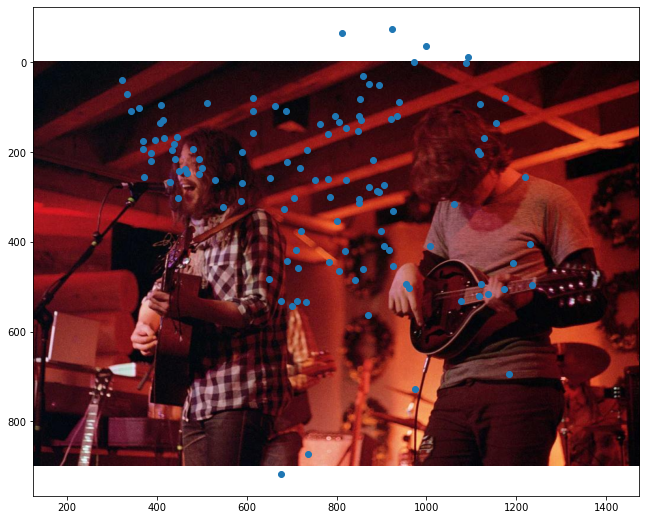

Recording length :  3.880000
RecStop - RecStart :  4004.0
Frame Count :  118
FPS :  0.029470529470529472
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_7_freeViewRec.webm
Trial_Id 7 image name i117772445


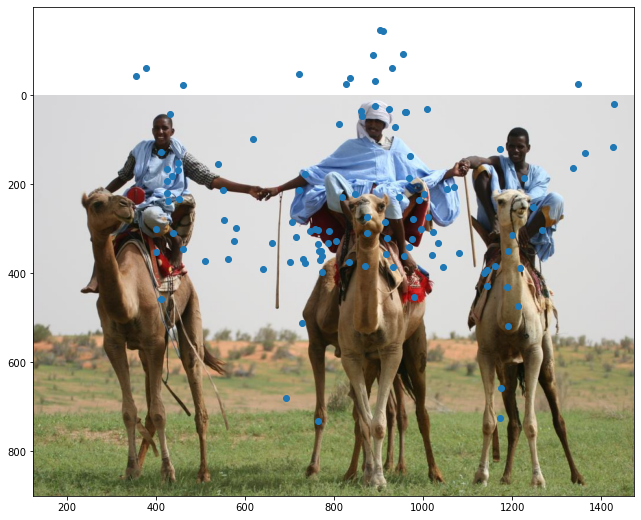

Recording length :  3.935000
RecStop - RecStart :  4003.0
Frame Count :  120
FPS :  0.029977516862353237
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_8_freeViewRec.webm
Trial_Id 6 image name i1158892521


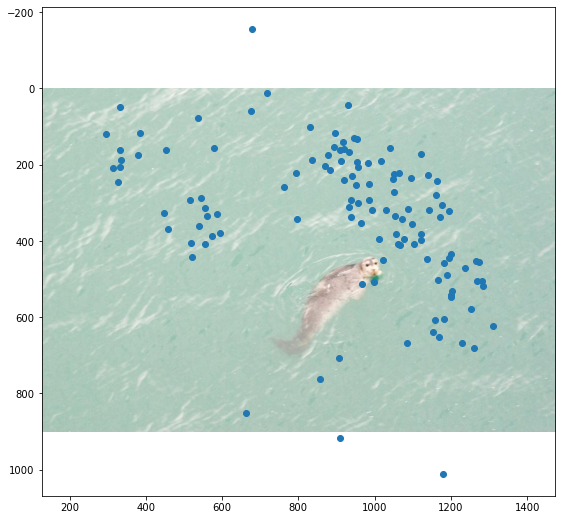

Recording length :  3.928000
RecStop - RecStart :  4002.0
Frame Count :  120
FPS :  0.029985007496251874
file name Subjects/s8/334789/blockNr_6_taskNr_6_trialNr_9_freeViewRec.webm
Trial_Id 4 image name i1126243635


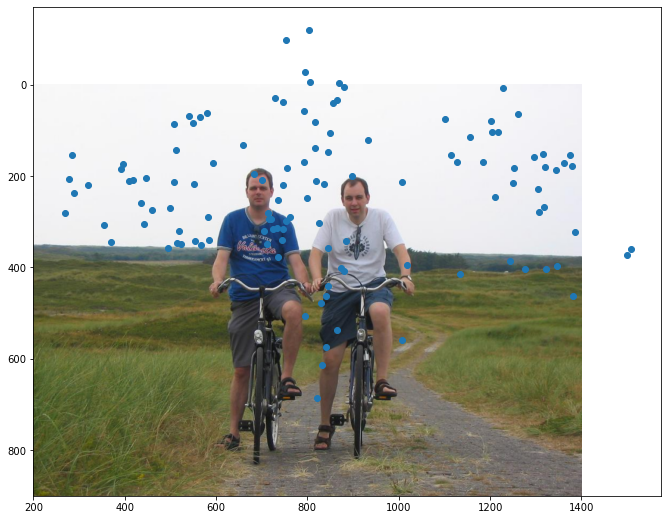

In [306]:
FV_analyse = FreeView( "s8", show=False)
trial_x, trial_y = FV_analyse.parse_trials(pred_path.MPII, analyse_blinks=False)

In [308]:
def subject_wise(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y"])
    for subb in tqdm(subjects):
        FV_analyse = FreeView(subb, show=False)
        trial_x,trial_y= FV_analyse.parse_trials(model, show = False)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y}, ignore_index = True)
    return df

model = pred_path.MPII
paths = glob.glob(os.path.join(model.value,'s*/pred_final'))
subjects = [path.split('/')[-2] for path in paths]
FV_df_mpii = subject_wise(subjects,model)

100%|███████████████████████████████████████████| 41/41 [01:17<00:00,  1.89s/it]


In [336]:
def plot_one_subject(trial, trial_x, trial_y, xlim=1600 ,ylim=900  , figsize=(18,9), n=14):
        img_name = FV_IMAGES[trial]
        fig,ax = plt.subplots(figsize=figsize)
        img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
        print("Trial_Id", trial, "image name", img_name)
        img,xbounds, ybounds = labVanced_present(img)
        ax.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0], ybounds[1]])
        ax.scatter(x=trial_x,y=trial_y)
#         ax.set_xlim(0,xlim)
#         ax.set_ylim(0,ylim)
        return ax
    
def plot_all_subjects(df, xlim=1600 ,ylim=900  , figsize=(18,9)):
    x_pts = FV_df_mpii.trial_x.apply(pd.Series) #rows: Subjects, columns: trials/images 
    y_pts = FV_df_mpii.trial_y.apply(pd.Series)
    for k in x_pts.columns: # images
        img_name = FV_IMAGES[k]
        palette = iter(sns.color_palette("colorblind",df.shape[0]))
        plt.figure(figsize=figsize)
        img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
        print("Trial_Id", trial, "image name", img_name)
        img,xbounds, ybounds = labVanced_present(img)
        plt.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0], ybounds[1]])
        for x,y in zip(x_pts[k],y_pts[k]):
            plt.scatter(x,y, color = next(palette))
#             ax.set_xlim(0,xlim)
#             ax.set_ylim(0,ylim)
        plt.gca().invert_yaxis()
        plt.show()

Trial_Id 2 image name i102423191


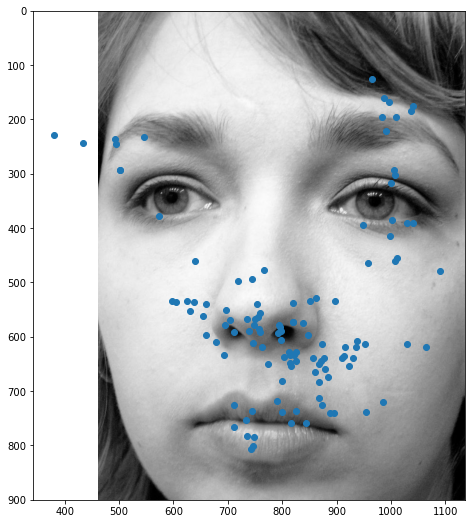

In [320]:
plot_one_subject(2,FV_df_mpii.iloc[7].trial_x[2],FV_df_mpii.iloc[7].trial_y[2])
plt.gca().invert_yaxis()

Trial_Id 9 image name i05june05_static_street_boston_p1010806


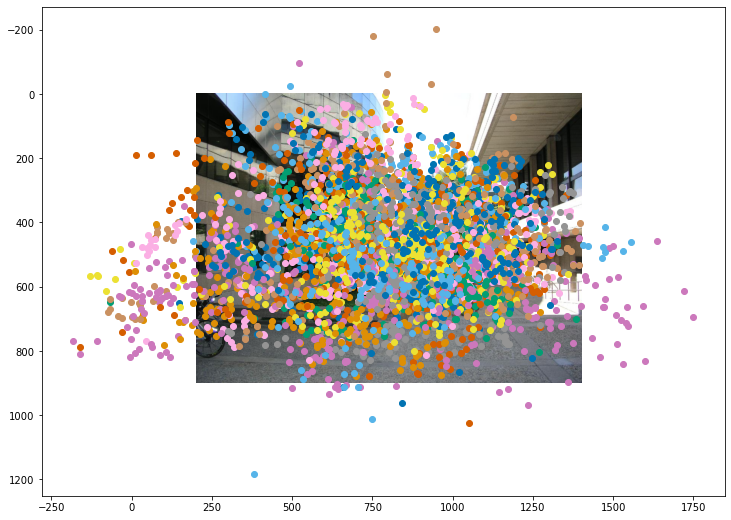

Trial_Id 9 image name i102423191


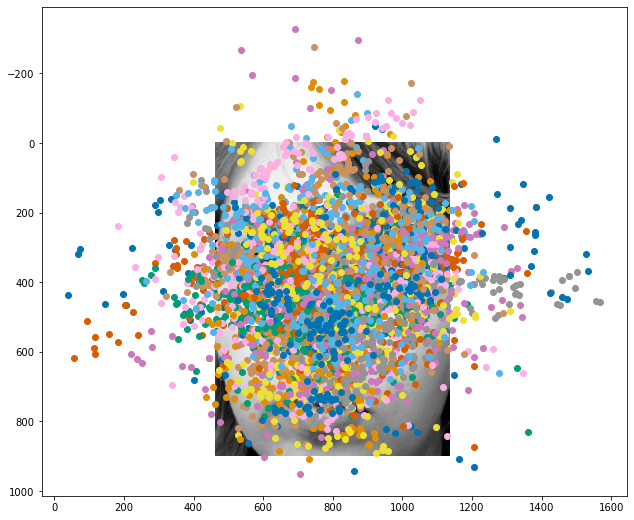

Trial_Id 9 image name i110996888


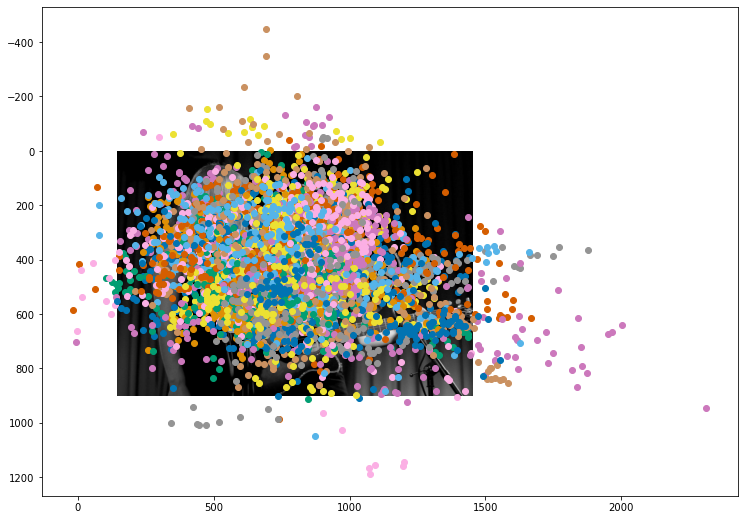

Trial_Id 9 image name i1126243635


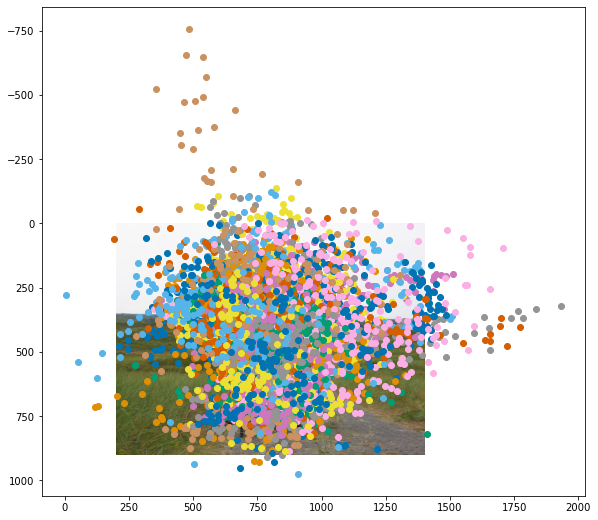

Trial_Id 9 image name i1142164052


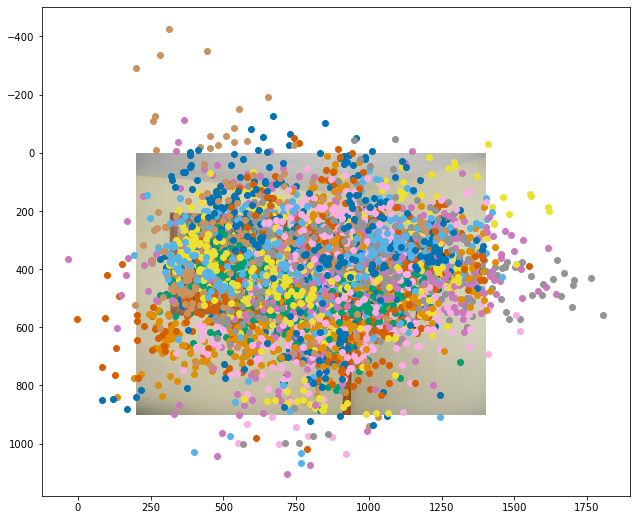

Trial_Id 9 image name i1158892521


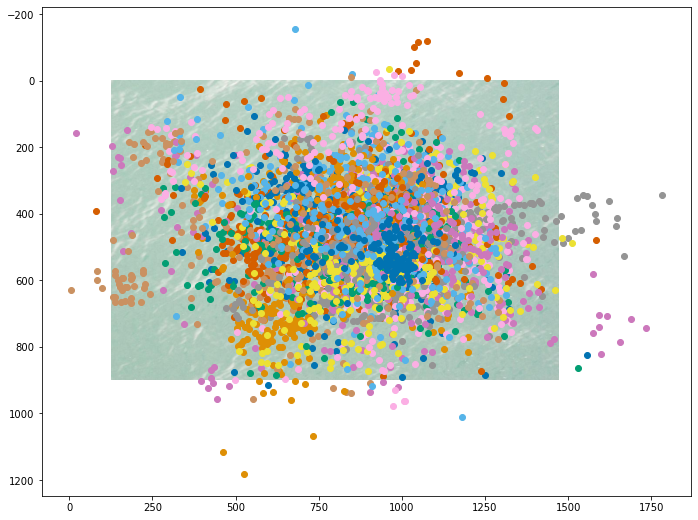

Trial_Id 9 image name i117772445


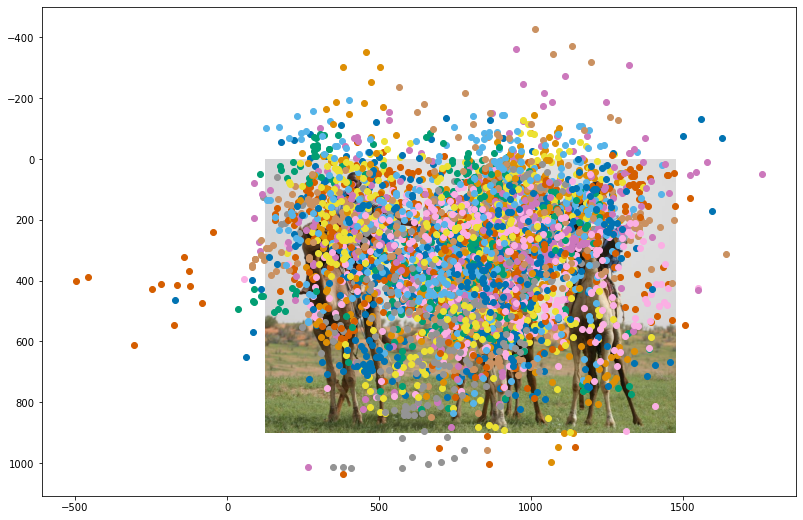

Trial_Id 9 image name i12030916


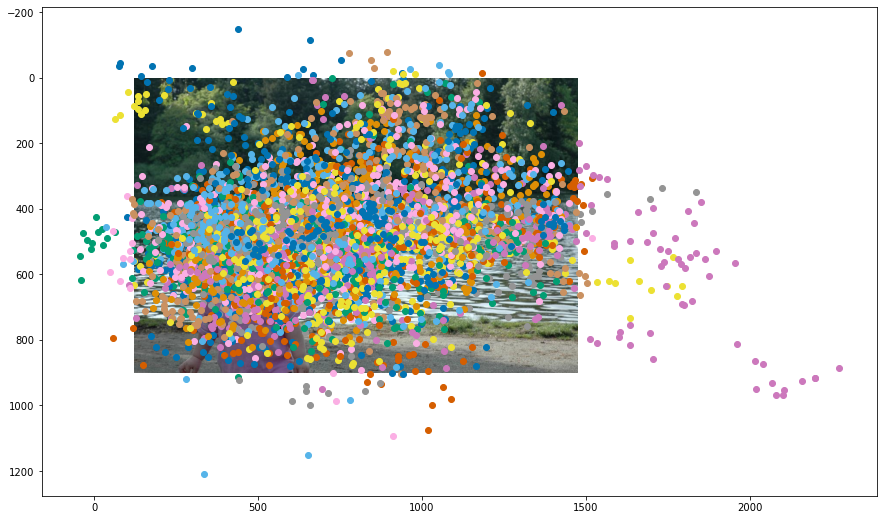

Trial_Id 9 image name i12049788


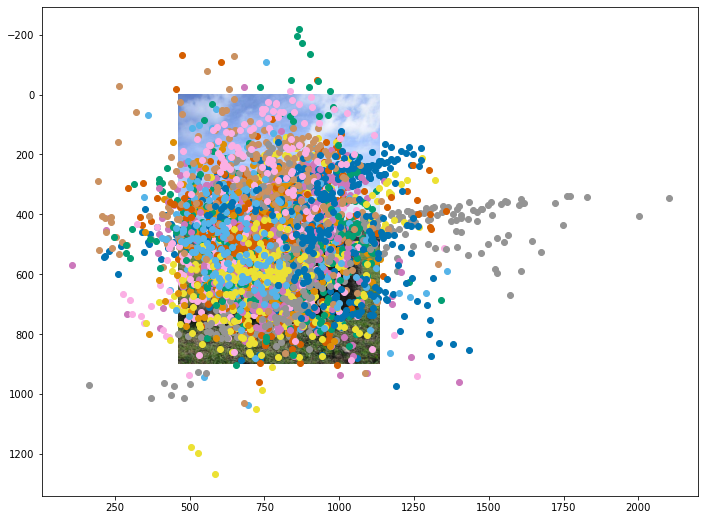

Trial_Id 9 image name i132419257


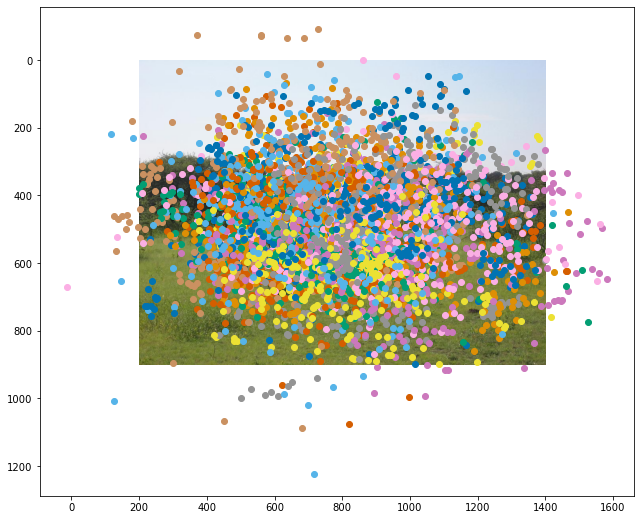

Trial_Id 9 image name i14020903


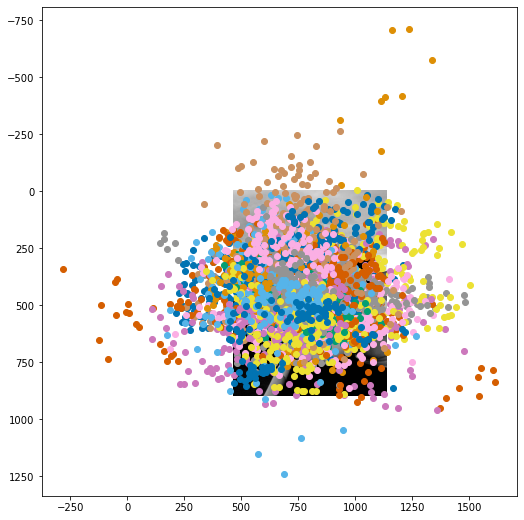

Trial_Id 9 image name i1508828


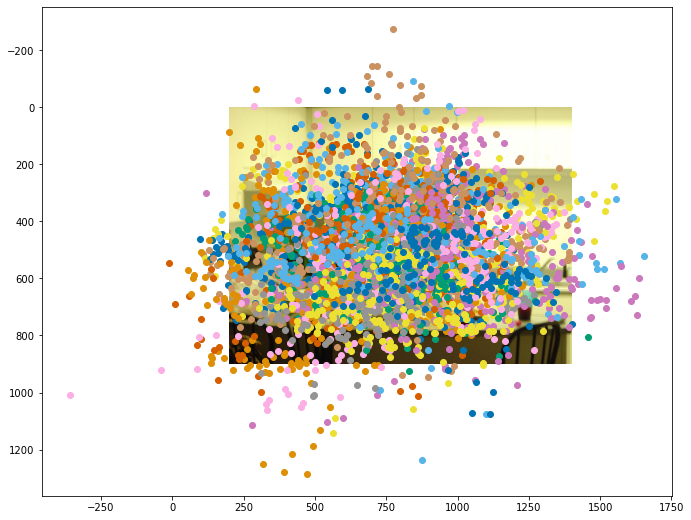

Trial_Id 9 image name i2057541


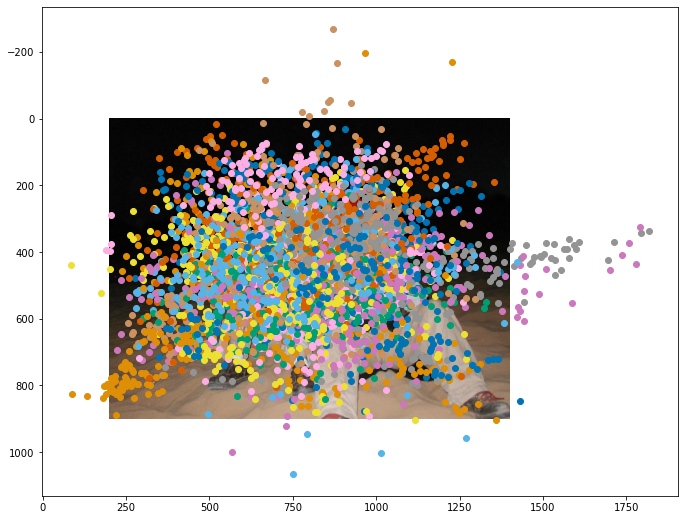

Trial_Id 9 image name i2234959271


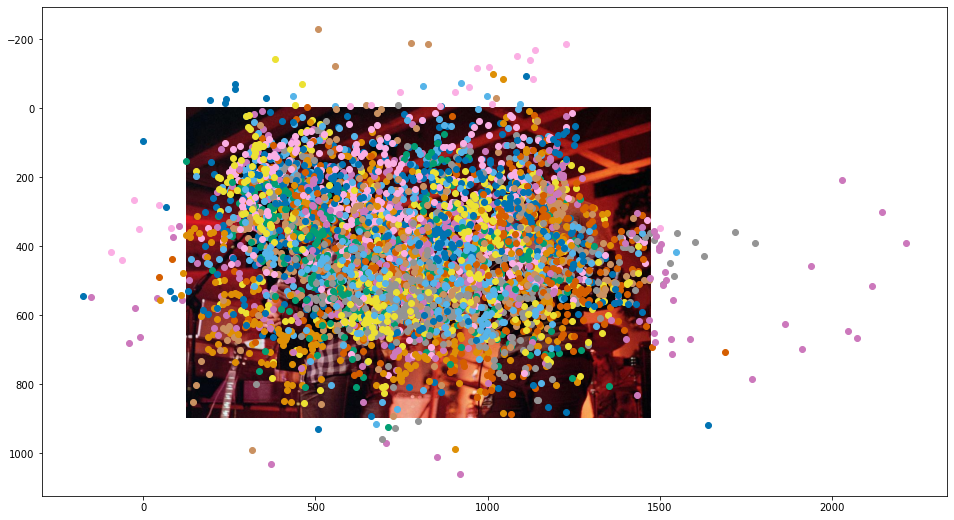

Trial_Id 9 image name i40576393


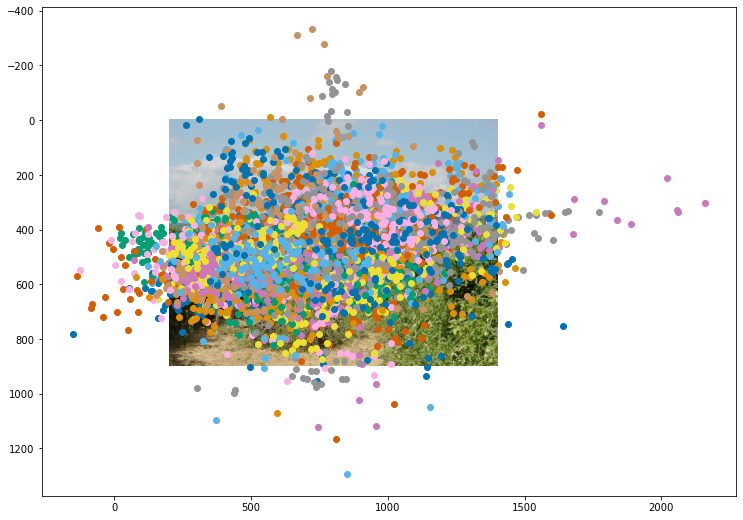

Trial_Id 9 image name i4466881


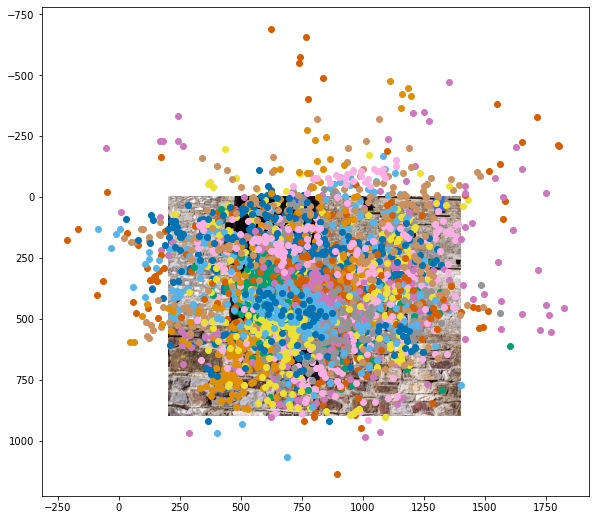

In [339]:
plot_all_subjects(FV_df_mpii) #2nd arg image_ids

In [393]:
import scipy
def KDE_plot(x,y):
    #adjust data range if needed
    xd = x
    yd = y

    values = np.vstack([xd,yd])
    kernel = scipy.stats.gaussian_kde(values, bw_method = 54/std_2D(x,y))

    xi, yi = np.mgrid[0:1600:1600j,0:900:900j]
    # xi,yi = np.mgrid[xd.min():xd.max():(xd.max()-xd.min())*1j, yd.min():yd.max():(yd.max() - yd.min())*1j]
    zi = kernel(np.vstack([xi.ravel(), yi.ravel()]))
    Z = np.reshape(zi.T, xi.shape)
    
    return np.flip(np.rot90(Z),0)

# plt.figure(figsize=(10,6))
# plt.scatter(x,y)
# Z = KDE_plot(x,y)
# plt.imshow(Z, cmap = plt.cm.gist_earth_r)#, extent = [x.min(),x.max(),y.min(),y.max()])

# plt.xlim(0,1600)
# plt.ylim(0,900)
# plt.gca().invert_yaxis()

In [ ]:
Z = KDE_plot(x=pd.concat(x_pts, ignore_index=True), y=pd.concat(y, ignore_index=True))
    kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
    ax[2].imshow(kde_heatmap,cmap = plt.get_cmap("gist_gray"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
#     ax[2] = sns.kdeplot(x=pd.concat(x, ignore_index=True), y=pd.concat(y, ignore_index=True), cmap="gray", shade=True, thresh=0.5, fill = True, clip=[xbounds, ybounds])

In [413]:
# x_mean = int(statistics.mean(x))
# y_mean  = int(statistics.mean(y))

# statistics.mean(x_pts[trial].explode(ignore_index=True))
x_pts[trial].explode(ignore_index=True).dropna().to_list()

[522,
 556,
 559,
 672,
 538,
 538,
 672,
 582,
 562,
 1037,
 1117,
 1025,
 837,
 992,
 1141,
 945,
 892,
 929,
 865,
 685,
 846,
 867,
 934,
 924,
 730,
 726,
 471,
 412,
 548,
 416,
 284,
 360,
 652,
 367,
 600,
 671,
 739,
 825,
 829,
 838,
 866,
 830,
 727,
 945,
 855,
 824,
 855,
 394,
 566,
 470,
 522,
 268,
 331,
 262,
 369,
 401,
 503,
 641,
 264,
 388,
 526,
 616,
 894,
 690,
 702,
 800,
 871,
 1090,
 1102,
 998,
 741,
 710,
 734,
 727,
 864,
 701,
 775,
 703,
 710,
 675,
 823,
 662,
 740,
 726,
 915,
 1150,
 1140,
 1030,
 978,
 961,
 1130,
 1125,
 1027,
 940,
 922,
 1012,
 935,
 914,
 847,
 707,
 977,
 695,
 668,
 543,
 586,
 668,
 897,
 1082,
 660,
 843,
 1019,
 1246,
 1180,
 745,
 646,
 392,
 149,
 481,
 499,
 793,
 811,
 844,
 813,
 873,
 842,
 801,
 729,
 867,
 916,
 895,
 921,
 887,
 950,
 989,
 963,
 934,
 947,
 963,
 837,
 818,
 835,
 785,
 688,
 696,
 730,
 738,
 778,
 892,
 950,
 940,
 961,
 1048,
 1013,
 1081,
 934,
 999,
 992,
 1058,
 1050,
 1046,
 957,
 1019,
 102

Trial_Id 1 image name i05june05_static_street_boston_p1010806
AUC       0.5493523209502634
CC        0.4421285512683477
SIM       0.42056068039715083


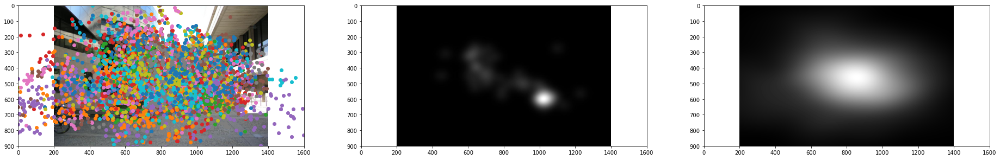

Trial_Id 2 image name i102423191
AUC       0.2714061288333786
CC        0.4452245490998107
SIM       0.37158343183631193


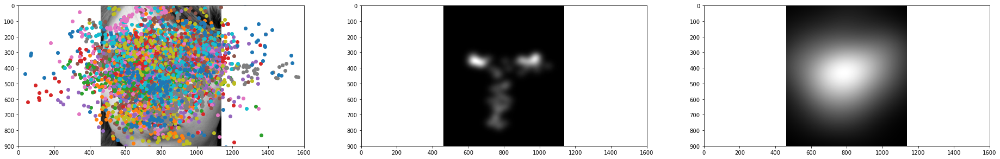

Trial_Id 3 image name i110996888
AUC       0.5024168294365331
CC        0.42371268496808284
SIM       0.36293653065404574


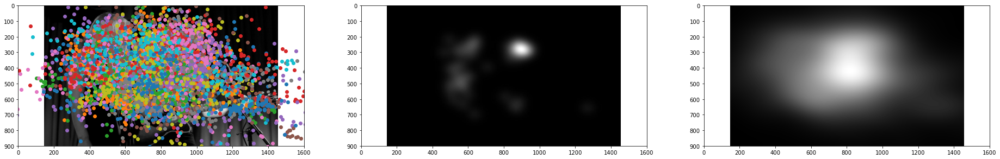

Trial_Id 4 image name i1126243635
AUC       0.5103414465847477
CC        0.5170521376505055
SIM       0.36263656595001464


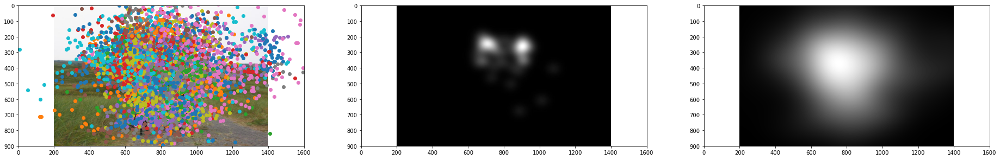

Trial_Id 5 image name i1142164052
AUC       0.49298891865088046
CC        0.47292383192840665
SIM       0.33939841380256425


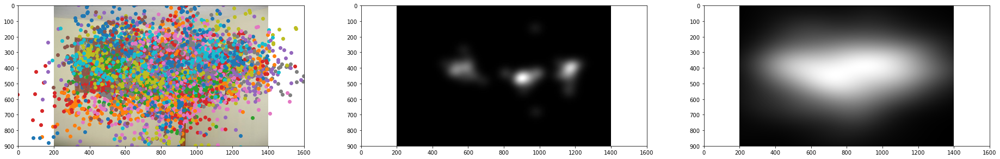

Trial_Id 6 image name i1158892521
AUC       0.5472461944059672
CC        0.5885175691512253
SIM       0.3897223117592223


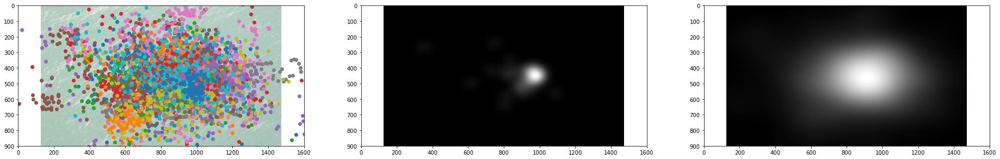

Trial_Id 7 image name i117772445
AUC       0.47220923174728424
CC        0.42079037698937966
SIM       0.35560746551812417


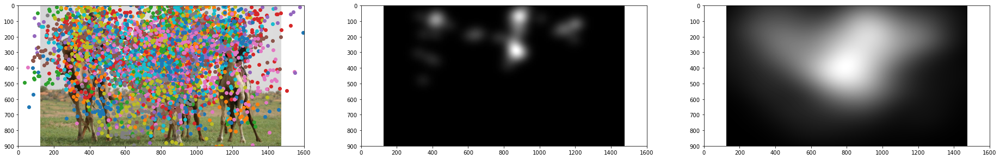

Trial_Id 8 image name i12030916
AUC       0.495387339934516
CC        0.5734714815174818
SIM       0.3661654366156491


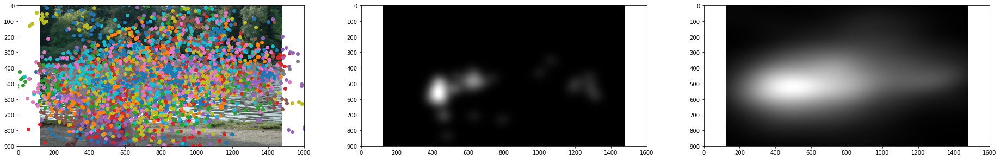

Trial_Id 9 image name i12049788
AUC       0.37134250055593415
CC        0.502321900614172
SIM       0.39386896205733996


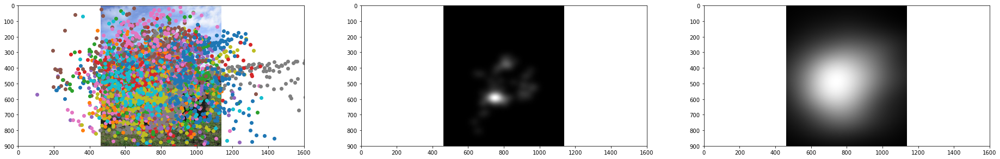

Trial_Id 10 image name i132419257
AUC       0.5172304897392259
CC        0.4563824228122417
SIM       0.34461238030129


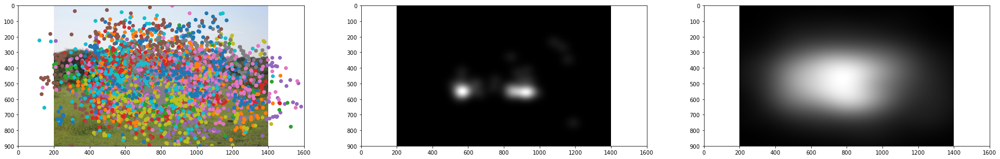

Trial_Id 11 image name i14020903
AUC       0.3340400545961189
CC        0.42485119355259865
SIM       0.38404850338442925


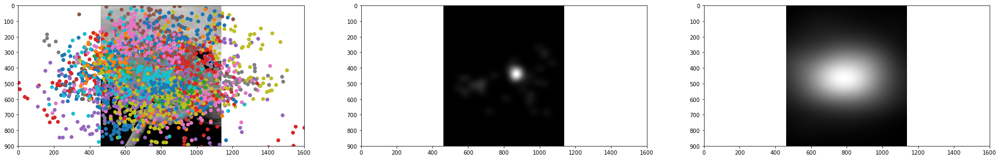

Trial_Id 12 image name i1508828
AUC       0.5033278093932939
CC        0.5059706838936388
SIM       0.4083527972303594


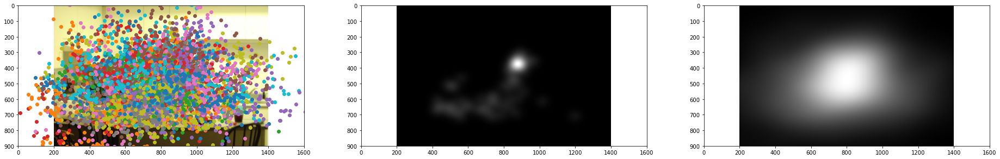

Trial_Id 13 image name i2057541
AUC       0.5048422841404424
CC        0.5064789430403072
SIM       0.35876656851255606


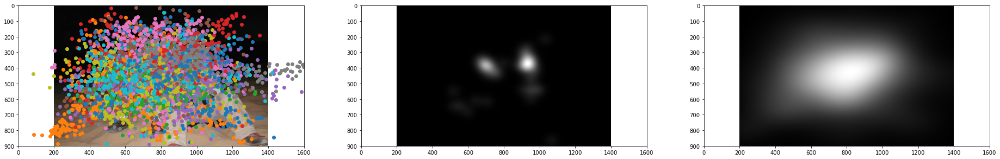

Trial_Id 14 image name i2234959271
AUC       0.48958540640436027
CC        0.3700325879472878
SIM       0.3377315160623771


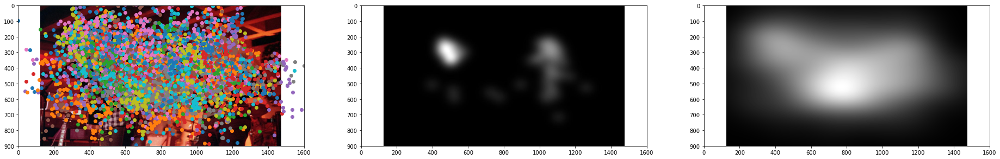

Trial_Id 15 image name i40576393
AUC       0.43823111855769353
CC        0.3742239791822654
SIM       0.3463781207629732


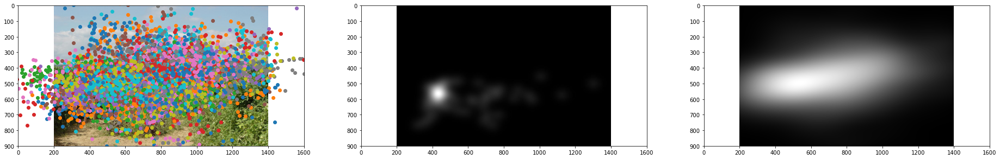

Trial_Id 16 image name i4466881
AUC       0.45078750693458813
CC        0.49153418500243407
SIM       0.32685009758280814


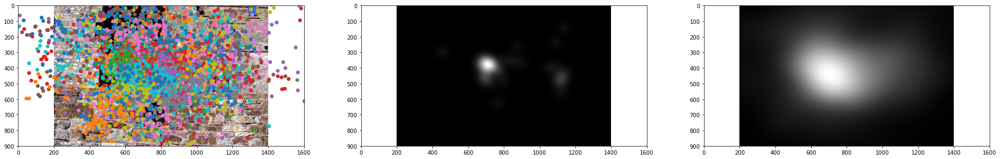

In [437]:
for trial in range(1,17):
    fig,ax = plt.subplots(1,3, figsize=(32,18))
    img_name = FV_IMAGES[trial]
#     palette = iter(sns.color_palette)
    print("Trial_Id", trial, "image name", img_name)
    
    img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
    img,xbounds,ybounds = labVanced_present(img)
    ax[0].imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
    x_pts = FV_df_mpii.trial_x.apply(pd.Series)
    y_pts = FV_df_mpii.trial_y.apply(pd.Series) 
    for x,y in zip(x_pts[trial],y_pts[trial]):
        ax[0].scatter(x,y)

    gt_heatmap = cv2.imread(
        "FreeView_maps/"+img_name+"_fixMap.jpg", cv2.IMREAD_GRAYSCALE)
    gt_heatmap = imutils.resize(gt_heatmap,height = 900, inter=cv2.INTER_CUBIC) #bi-cubic/nearest is what Matlab imresize() does by default
    ax[1].imshow(gt_heatmap,cmap = plt.get_cmap("gist_gray"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
    
    #KDE
    Z = KDE_plot(x=x_pts[trial].explode(ignore_index=True).dropna().to_list(), y=y_pts[trial].explode(ignore_index=True).dropna().to_list())
    kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
    ax[2].imshow(kde_heatmap,cmap = plt.get_cmap("gist_gray"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
#     ax[2] = sns.kdeplot(x=pd.concat(x, ignore_index=True), y=pd.concat(y, ignore_index=True), cmap="gray", shade=True, thresh=0.5, fill = True, clip=[xbounds, ybounds])
    
    print("{:10}{}".format("AUC",AUC_Judd(gt_heatmap,x_pts[trial],y_pts[trial])))
    print("{:10}{}".format("CC",CC(gt_heatmap, kde_heatmap)))
    print("{:10}{}".format("SIM",SIM(gt_heatmap, kde_heatmap)))
    
    for i in range(3):
        ax[i].set_xlim(0,1600)
        ax[i].set_ylim(0,900)
        ax[i].invert_yaxis()
        ax[i].set_aspect(14/16)
#     plt.gca().invert_yaxis()
    plt.show()
    
# ax.set_frame_on(False)
# # fig.savefig('kde.png', transparent=True, bbox_inches='tight', pad_inches=0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


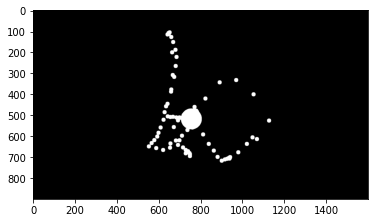

113.0830833634042


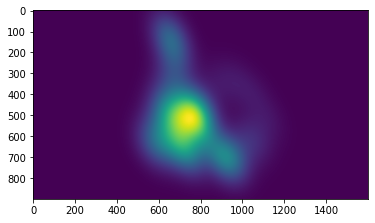

In [609]:
#tEST POC
# from scipy.spatial import distance
# temp = np.zeros((900,1600,3))
# x_mean = int(statistics.mean(x[0]))
# y_mean  = int(statistics.mean(y[0]))
# d_mean=[]
# for i,j in zip(x[0],y[0]):
# #     temp[j,i] == 1
#     temp = cv2.circle(temp,center=(i,j),radius=10,color=[255,255,255],thickness=-1)
#     d_mean.append(distance.euclidean([x_mean,y_mean],[i,j]))

# temp = cv2.circle(temp,center=(x_mean,y_mean),radius=50,color=[255,120,120],thickness=-1)
# plt.imshow(temp, cmap = "Greys")
# plt.show()

# #std
# std_d = statistics.stdev(d_mean)
# print(std_d)

# values = np.vstack([x[0],y[0]])
# kernel = scipy.stats.gaussian_kde(values, bw_method = 54.04/std_d)

# xi, yi = np.mgrid[0:1600:1600j,0:900:900j]
# # xi,yi = np.mgrid[xd.min():xd.max():(xd.max()-xd.min())*1j, yd.min():yd.max():(yd.max() - yd.min())*1j]
# zi = kernel(np.vstack([xi.ravel(), yi.ravel()]))
# Z = np.reshape(zi.T, xi.shape)

# plt.imshow(np.flip(np.rot90(Z),0))

# Blinks

In [677]:
import ffmpeg   
from scipy.signal import find_peaks, peak_prominences
pd.options.plotting.backend = "matplotlib"

class Blink_Detect():
    def __init__(self, subb, show=True):
        
        self.subb = subb
        self.df = pd.read_csv("Subjects/s"+subb+"/data.csv")
        self.task_df = self.df[self.df["Task_Name"] == "5. Blink Detect"]
        self.palette = cm.rainbow(np.linspace(0, 1, 12))
        if show:
            print("blinks_df summary \n {}".format(self.summary()))

    def summary(self):
        print(self.task_df.iloc[0].dropna()[5:17])
    
    def get_preds(self, model):
        trial_probs = {key:[] for key in range(1,11)}
        for _,row in self.task_df.iterrows():
            rec_name = row.BlinkRec
            pred_df = pd.read_csv(os.path.join(model.value, "s{}/{}.csv".format(self.subb,rec_name[:-5]))) 
            trial_probs[row.Trial_Id + (5 if row.Block_Nr == 13 else 0)] = pred_df.iloc[:,-1]
        return trial_probs
    
    def parse_trials(self, model, show = True):
        
        trial_peaks = {key:[] for key in range(1,11)}
        
        for _,row in self.task_df.iterrows():
            rec_name = row.BlinkRec
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(self.subb,rec_id,rec_name)

            start_times = row.beep_times.split("---values=")[1].strip("\"").split(";")
            start_times = [int(t) - int(row.RecStart) for t in start_times if len(t)>1]
            
            stop_times = row.beepEndTimes.split("---values=")[1].strip("\"").split(";")
            stop_times = [int(t) - int(row.RecStart) for t in stop_times if len(t)>1]
            
            pred_df = pd.read_csv(os.path.join(model.value, "s{}/{}.csv".format(self.subb,rec_name[:-5]))) 
            
            if pred_df[pred_df.iloc[:,-1] == "NA"].shape[0] > 0.3*pred_df.shape[0]:
                print("> 30% missing data")
                continue
            
            disp_df = pred_df.replace("NA",np.nan).interpolate(method='linear') #try other Interpolation methods?
            med = statistics.median(disp_df.iloc[:,-1])
            print("median:",med)
            
            #threshold conf = 50% and distance between 2 consecutive blinks = 3 frames ~ 3*33 = 99ms since typical blink duration is btw 0.1 to 0.4 s (Ehinger battery paper)
            if model.name == "EAR":
                peaks, _ = find_peaks(-disp_df.iloc[:,-1].to_numpy(), threshold = -1.5*med, distance = 35)
            elif model.name == "RT_BENE":
                peaks, _ = find_peaks(disp_df.iloc[:,-1].to_numpy(), height = 5*med, distance = 35) 
            
            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording Name : ",rec_name)
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("start times : ",start_times)
                print("stop times : ",stop_times)
                print("diff : ", [int(i)-int(j) for i,j in zip(start_times, [0]+stop_times[:-1])]) 
                disp_df.plot(x="frame", y=disp_df.columns[-1], figsize=(12,8))
                ymin,ymax = plt.gca().get_ylim()
                plt.vlines(time_to_frame(start_times, fname),ymin,ymax, linestyles ='dashed', colors = 'gray')
                plt.plot(peaks, disp_df.iloc[:,-1][peaks], "x", markersize = 10)
                plt.show()
                print("-"*50)
            
            trial_peaks[row.Trial_Id + (5 if row.Block_Nr == 13 else 0)] = peaks
            
        return trial_peaks
    
    def parse_trials_stack(self, model, show = True):
        trial_latency= {key:[] for key in range(1,11)}
        
        for _,row in self.task_df.iterrows():
            rec_name = row.BlinkRec
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(self.subb,rec_id,rec_name)

            start_times = row.beep_times.split("---values=")[1].strip("\"").split(";")
            start_times = [int(t) - int(row.RecStart) for t in start_times if len(t)>1]
            
            intervals = [int(i)-int(j) for i,j in zip(start_times[1:], start_times[:-1])]
            
#             stop_times = row.beepEndTimes.split("---values=")[1].strip("\"").split(";")
#             stop_times = [int(t) - int(row.RecStart) for t in stop_times if len(t)>1]
            
            pred_df = pd.read_csv(os.path.join(model.value, "s{}/{}.csv".format(self.subb,rec_name[:-5]))) 
            
            if pred_df[pred_df.iloc[:,-1] == "NA"].shape[0] > 0.3*pred_df.shape[0]:
                print("> 30% missing data")
                continue
            
            disp_df = pred_df.replace("NA",np.nan).interpolate(method='linear') #try other Interpolation methods?
#             med = statistics.median(disp_df.iloc[:,-1])
#             print("median:",med)
            
            #threshold conf = 50% and distance between 2 consecutive blinks = 3 frames ~ 3*33 = 99ms since typical blink duration is btw 0.1 to 0.4 s (Ehinger battery paper)
#             if model.name == "EAR":
#                 peaks, _ = find_peaks(-disp_df.iloc[:,-1].to_numpy(), threshold = -1.5*med, distance = 35)
#             elif model.name == "RT_BENE":
#                 peaks, _ = find_peaks(disp_df.iloc[:,-1].to_numpy(), height = 5*med, distance = 35) 
            out = thresholding_algo(disp_df.iloc[:,-1].to_numpy(), 40, 4, 0)
            signals = np.pad(out["signals"][40:],(40,0),constant_values=0)
            onsets = time_to_frame(start_times, fname)
            assert len(signals) == disp_df.shape[0]
            
            latency=[]
            mean_interval = time_to_frame([statistics.mean(intervals)],fname)[0]
            print("mean int",mean_interval)
            for i,j in zip(onsets,(onsets[1:]+[onsets[-1]+mean_interval])):
                if -1 in signals[i:j]:
                    latency.append(np.where(signals[i:j]==-1)[0][0])
                else:
                    latency.append(np.nan)
            print("LATENCY",latency)
                           
            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording Name : ",rec_name)
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("start times : ",start_times)
#                 print("stop times : ",stop_times)
                print("inter-beat duration : ", intervals) 
                print("Latency: ",latency)
                disp_df.plot(x="frame", y=disp_df.columns[-1], figsize=(12,8))
                ymin,ymax = plt.gca().get_ylim()
                plt.vlines(time_to_frame(start_times, fname),ymin,ymax, linestyles ='dashed', colors = 'gray')
                plt.show()
                plt.figure(figsize=(12,7))
                plt.plot(signals)
                plt.show()
                print("-"*50)
            
            trial_latency[row.Trial_Id + (5 if row.Block_Nr == 13 else 0)] = np.array(latency)
            
        return trial_latency

In [678]:
blink_analyse = Blink_Detect("8")

Trial_Id                                                        5
beep_times      "times=1630506950363;1630506951800;16305069537...
beepEndTimes    "times=1630506950363;1630506952331;16305069540...
BlinkRec             blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Condition_Id                                                    1
FrameEnd                                          1630506964584.0
FrameStart                                        1630506950366.0
iter            "times=1630506950363;1630506952337;16305069540...
next_time       "times=1630506950369;1630506952332;16305069540...
random          "times=1630506950363;1630506950368;16305069523...
RecStart                                                      2.0
RecStop                                                   13634.0
Name: 7, dtype: object
blinks_df summary 
 None


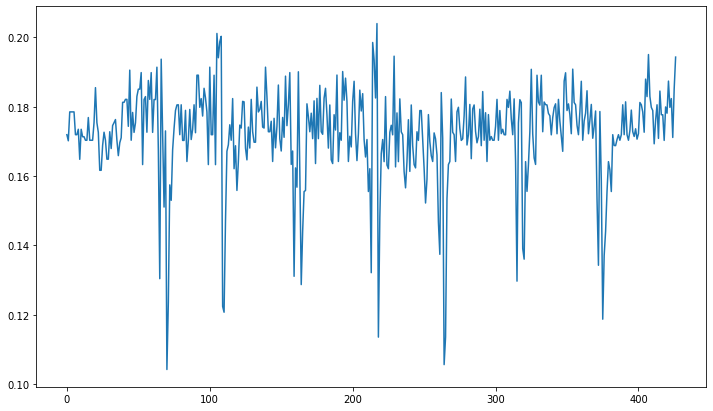

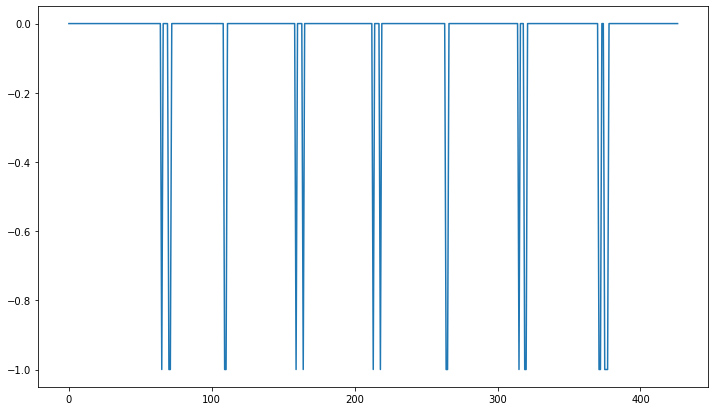

In [335]:
import numpy as np
import pylab
#Brakel, J.P.G. van (2014). "Robust peak detection algorithm using z-scores". Stack Overflow. Available at: https://stackoverflow.com/questions/22583391/peak-signal-detection-in-realtime-timeseries-data/22640362#22640362 (version: 2020-11-08).
def thresholding_algo(y, lag, threshold, influence):
    signals = np.zeros(len(y))
    filteredY = np.array(y)
    avgFilter = [0]*len(y)
    stdFilter = [0]*len(y)
    avgFilter[lag - 1] = np.mean(y[0:lag])
    stdFilter[lag - 1] = np.std(y[0:lag])
    for i in range(lag, len(y)):
        if abs(y[i] - avgFilter[i-1]) > threshold * stdFilter [i-1]:
            if y[i] > avgFilter[i-1]:
                signals[i] = 1
            else:
                signals[i] = -1

            filteredY[i] = influence * y[i] + (1 - influence) * filteredY[i-1]
            avgFilter[i] = np.mean(filteredY[(i-lag+1):i+1])
            stdFilter[i] = np.std(filteredY[(i-lag+1):i+1])
        else:
            signals[i] = 0
            filteredY[i] = y[i]
            avgFilter[i] = np.mean(filteredY[(i-lag+1):i+1])
            stdFilter[i] = np.std(filteredY[(i-lag+1):i+1])

    return dict(signals = np.asarray(signals),
                avgFilter = np.asarray(avgFilter),
                stdFilter = np.asarray(stdFilter))

out = thresholding_algo(ear_preds[1], 40, 4, 0)
plt.figure(figsize=(12,7))
plt.plot(ear_preds[1])
plt.show()
plt.figure(figsize=(12,7))
plt.plot(np.pad(out["signals"][40:],(40,0),constant_values=0))

plt.show()

[ 27  71 111 145 164 187 238 265 297 320 344 376 398]
[0.         0.         0.         0.         0.06269266 0.
 0.         0.         0.         0.04597876 0.         0.
 0.        ]


/tmp/ipykernel_5677/2144166655.py:13: PeakPropertyWarning: some peaks have a prominence of 0
  proms = peak_prominences(x, peaks)[0]


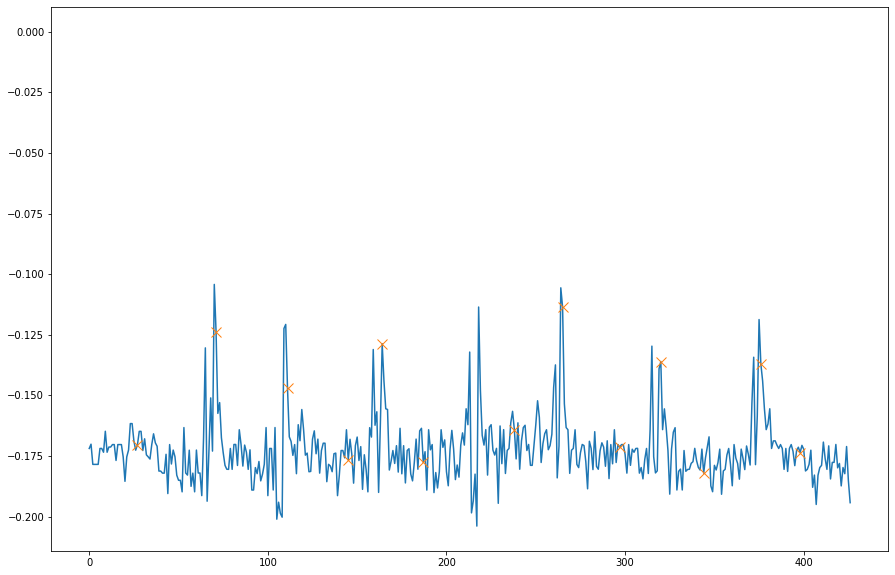

(0.0, 1.0)

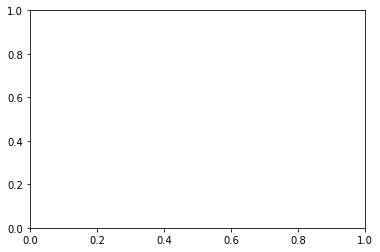

In [212]:
#test
from scipy.signal import find_peaks_cwt, peak_prominences

# for i in rtbene_preds.keys():
ear_preds = blink_analyse.get_preds(pred_path.EAR)

i=1
x = -1*ear_preds[i].to_numpy()

#threshold conf = 50% and distance between 2 consecutive blinks = 3 frames ~ 3*33 = 99ms since typical blink duration is btw 0.1 to 0.4 s (Ehinger battery paper)
peaks = find_peaks_cwt(x, np.arange(1,20)) #, height = -0.2, distance = 7)  #, prominence = 0.3) 
print(peaks)
proms = peak_prominences(x, peaks)[0]
print(proms)
plt.figure(figsize=(15,10))
plt.plot(x)
# plt.vlines(3,x.min(),x.max(), linestyles ='dashed', colors = 'orange')
plt.plot(peaks, x[peaks], "x", markersize = 10)
plt.plot(np.zeros_like([20]), "--", color="gray")
# plt.plot(np.zeros_like(rtbene_preds[1].to_numpy()), "--", color="gray")
plt.show()
plt.gca().get_ylim()

## EAR

mean int 49
LATENCY [26, 15, 14, 15, 13, 12, 14]
Recording Name :  blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.634000
RecStop - RecStart :  13632.0
Frame Count :  409
FPS :  29.998533079067037
start times :  [1432, 3396, 5109, 6633, 8281, 9814, 11340]
inter-beat duration :  [1964, 1713, 1524, 1648, 1533, 1526]
Latency:  [26, 15, 14, 15, 13, 12, 14]


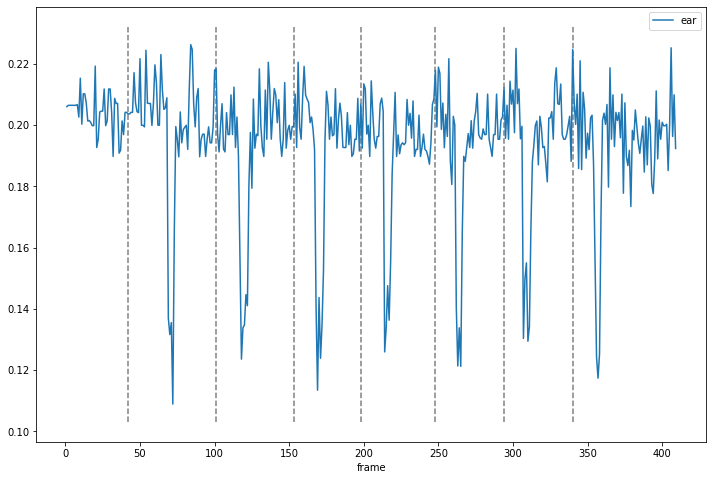

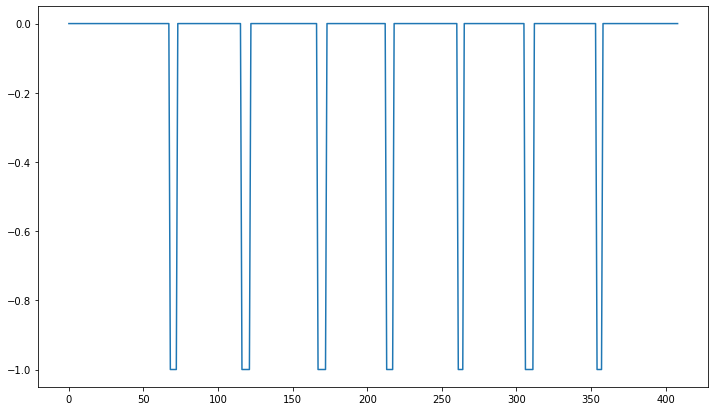

--------------------------------------------------
mean int 48
LATENCY [15, 13, 14, 13, 11, 15, 15]
Recording Name :  blockNr_13_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  13.436000
RecStop - RecStart :  13416.0
Frame Count :  403
FPS :  29.994045846978267
start times :  [1344, 2934, 4745, 6319, 7912, 9585, 11125]
inter-beat duration :  [1590, 1811, 1574, 1593, 1673, 1540]
Latency:  [15, 13, 14, 13, 11, 15, 15]


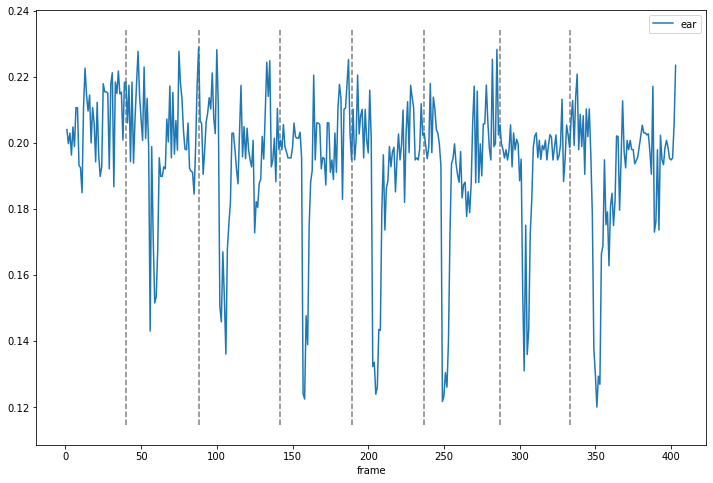

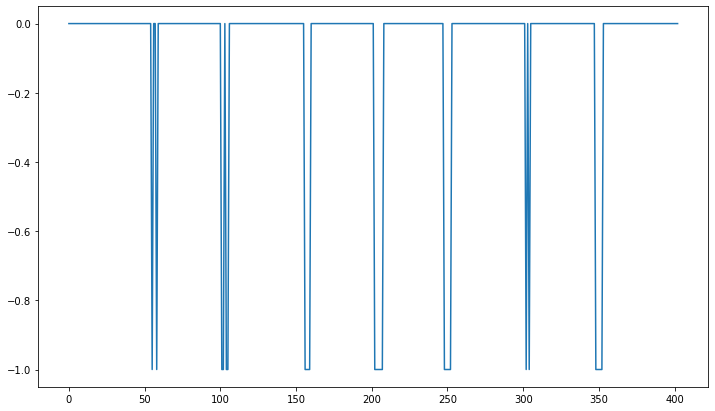

--------------------------------------------------
mean int 51
LATENCY [20, 14, 15, 15, 16, 15, 11]
Recording Name :  blockNr_13_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  13.867000
RecStop - RecStart :  13858.0
Frame Count :  416
FPS :  29.999278863488858
start times :  [1211, 2933, 4659, 6542, 8147, 9931, 11576]
inter-beat duration :  [1722, 1726, 1883, 1605, 1784, 1645]
Latency:  [20, 14, 15, 15, 16, 15, 11]


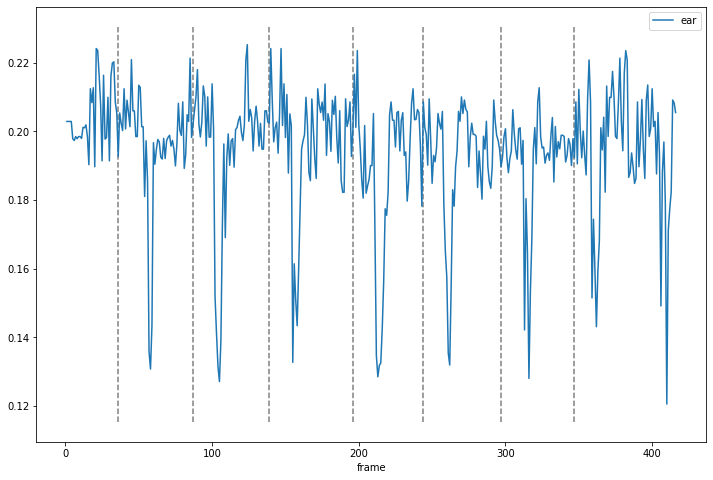

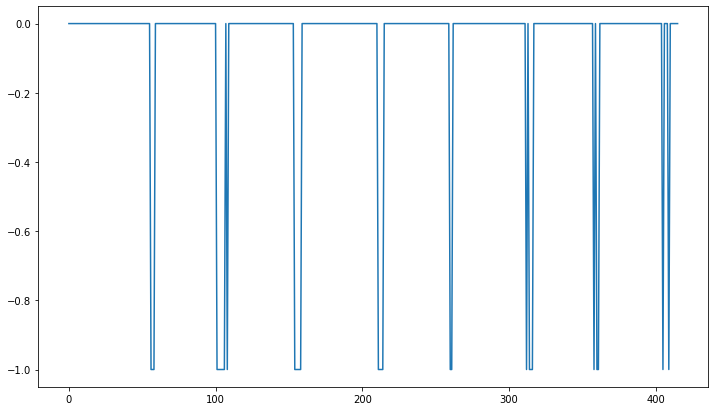

--------------------------------------------------
mean int 51
LATENCY [15, 14, 12, 13, 13, 15, 15]
Recording Name :  blockNr_13_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  13.975000
RecStop - RecStart :  13967.0
Frame Count :  419
FPS :  29.982110912343472
start times :  [1385, 2929, 4549, 6339, 8161, 9968, 11637]
inter-beat duration :  [1544, 1620, 1790, 1822, 1807, 1669]
Latency:  [15, 14, 12, 13, 13, 15, 15]


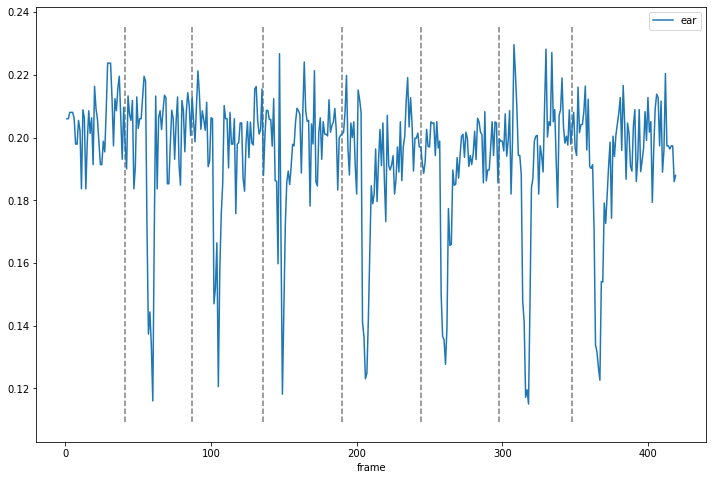

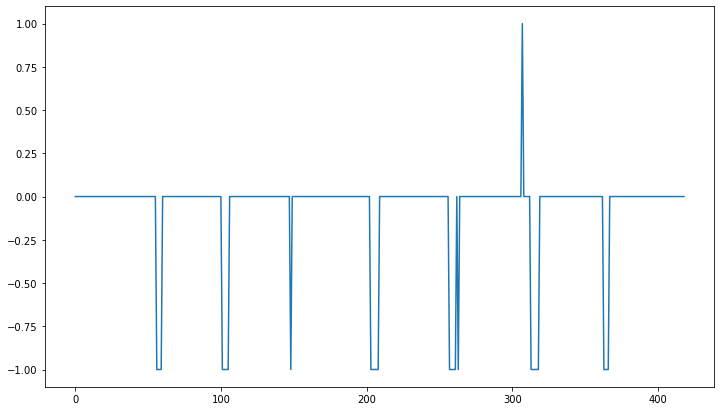

--------------------------------------------------
mean int 51
LATENCY [19, 16, 17, 18, 15, 16, 15]
Recording Name :  blockNr_13_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.222000
RecStop - RecStart :  14221.0
Frame Count :  427
FPS :  30.023906623540995
start times :  [1558, 3115, 4922, 6566, 8457, 10315, 11912]
inter-beat duration :  [1557, 1807, 1644, 1891, 1858, 1597]
Latency:  [19, 16, 17, 18, 15, 16, 15]


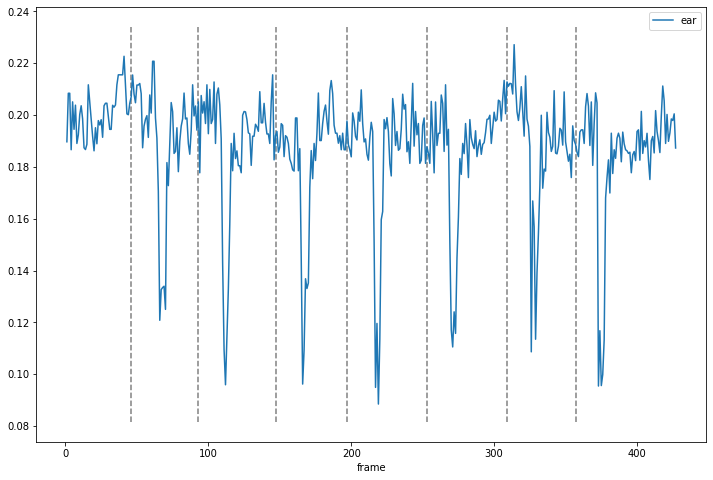

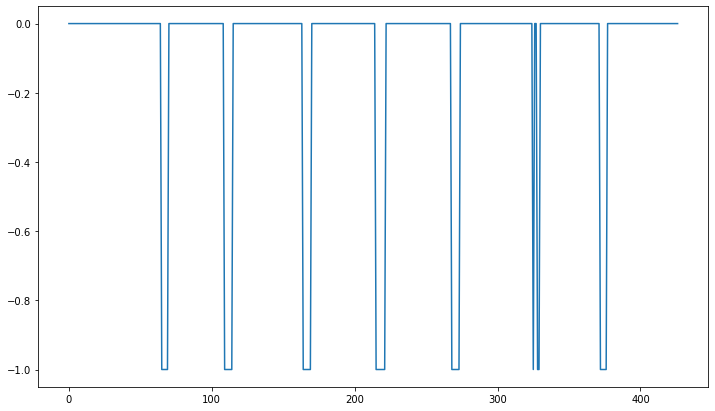

--------------------------------------------------
mean int 49
LATENCY [19, 18, 12, 13, 10, 16, 16]
Recording Name :  blockNr_6_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.560000
RecStop - RecStart :  13559.0
Frame Count :  407
FPS :  30.01474926253687
start times :  [1443, 3011, 4515, 6003, 7654, 9453, 11239]
inter-beat duration :  [1568, 1504, 1488, 1651, 1799, 1786]
Latency:  [19, 18, 12, 13, 10, 16, 16]


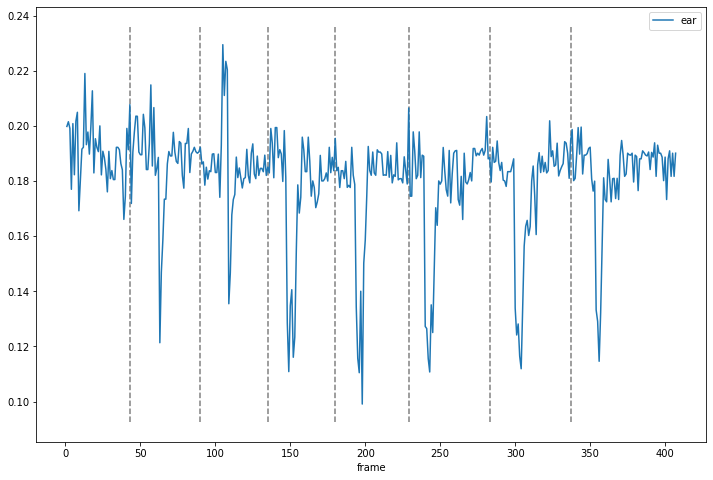

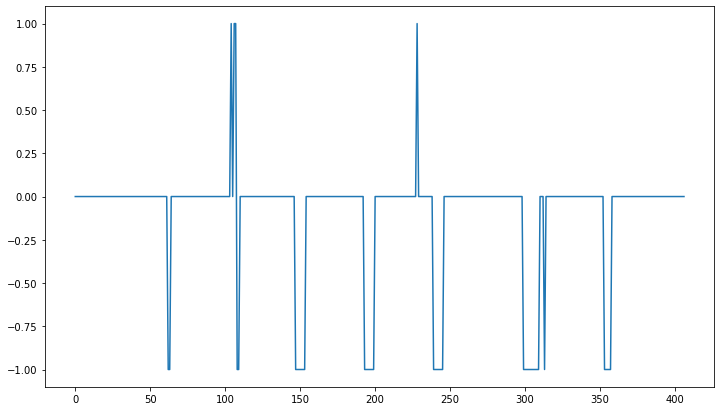

--------------------------------------------------
mean int 52
LATENCY [4, 19, 14, 15, 19, 17, nan]
Recording Name :  blockNr_6_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  14.025000
RecStop - RecStart :  14043.0
Frame Count :  420
FPS :  29.946524064171122
start times :  [1297, 2832, 4714, 6578, 8251, 9938, 11731]
inter-beat duration :  [1535, 1882, 1864, 1673, 1687, 1793]
Latency:  [4, 19, 14, 15, 19, 17, nan]


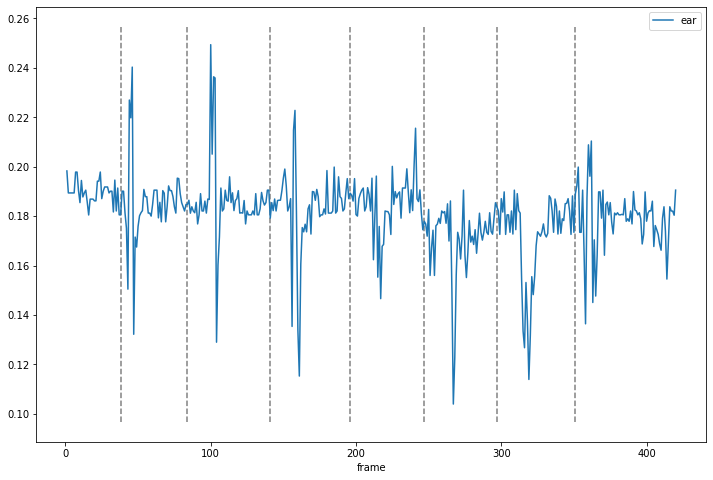

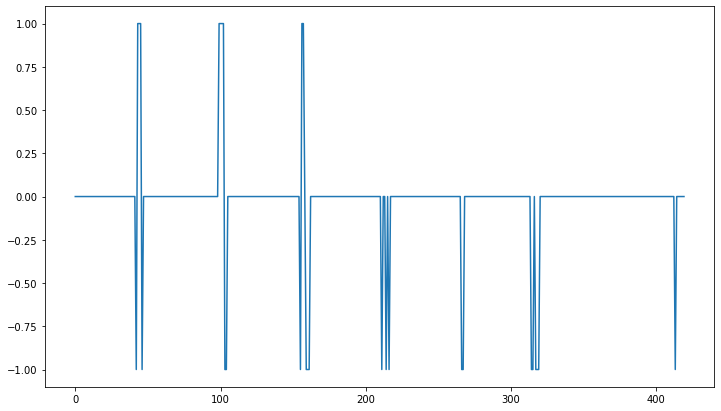

--------------------------------------------------
mean int 52
LATENCY [23, 20, 14, 15, 18, 14, 14]
Recording Name :  blockNr_6_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  14.233000
RecStop - RecStart :  14238.0
Frame Count :  427
FPS :  30.00070259256657
start times :  [1418, 2993, 4841, 6617, 8221, 10037, 11914]
inter-beat duration :  [1575, 1848, 1776, 1604, 1816, 1877]
Latency:  [23, 20, 14, 15, 18, 14, 14]


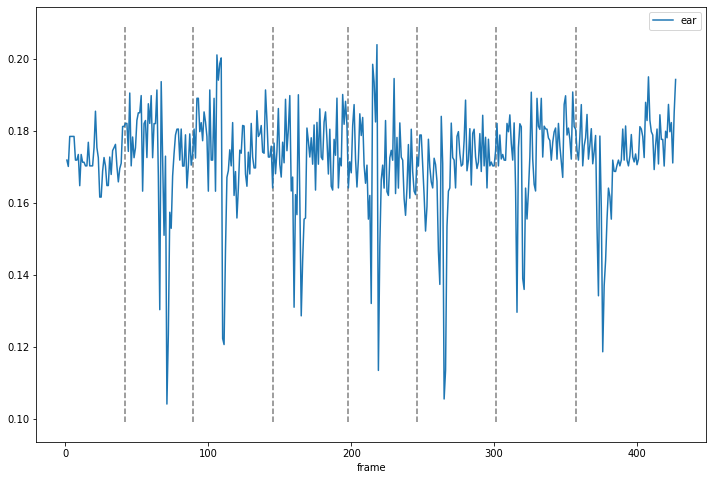

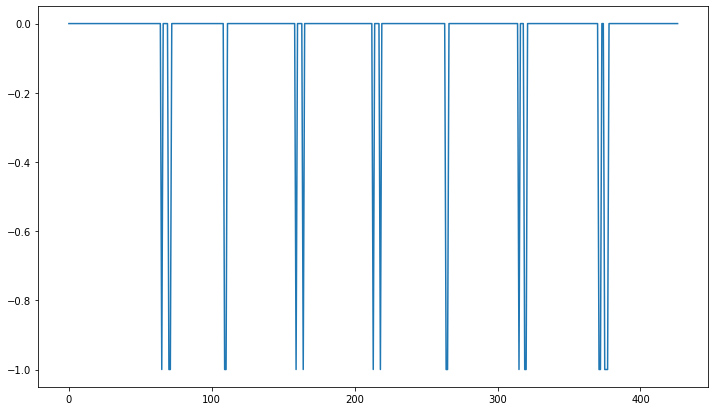

--------------------------------------------------
mean int 54
LATENCY [15, 10, nan, 14, 12, 14, 14]
Recording Name :  blockNr_6_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  14.518000
RecStop - RecStart :  14522.0
Frame Count :  435
FPS :  29.962804794048765
start times :  [1357, 3073, 4831, 6660, 8595, 10408, 12190]
inter-beat duration :  [1716, 1758, 1829, 1935, 1813, 1782]
Latency:  [15, 10, nan, 14, 12, 14, 14]


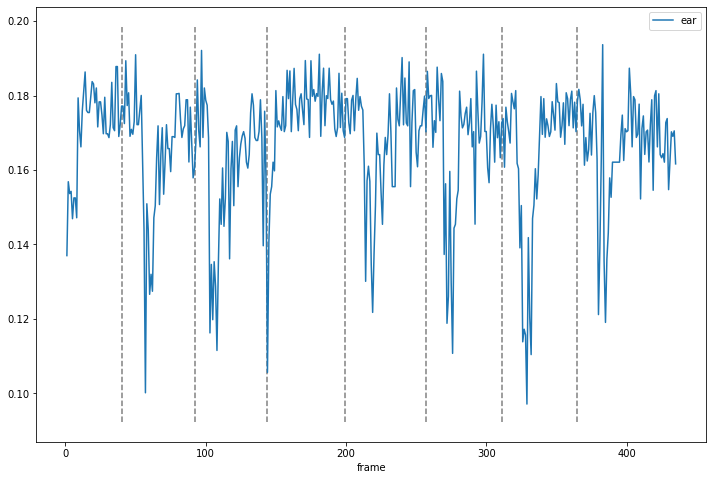

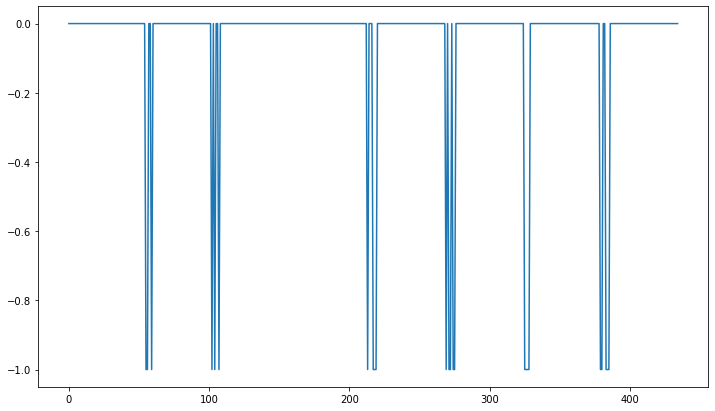

--------------------------------------------------
mean int 51
LATENCY [24, 18, 14, nan, nan, nan, nan]
Recording Name :  blockNr_6_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.253000
RecStop - RecStart :  14237.0
Frame Count :  427
FPS :  29.95860520592156
start times :  [1593, 3149, 4957, 6789, 8655, 10210, 11910]
inter-beat duration :  [1556, 1808, 1832, 1866, 1555, 1700]
Latency:  [24, 18, 14, nan, nan, nan, nan]


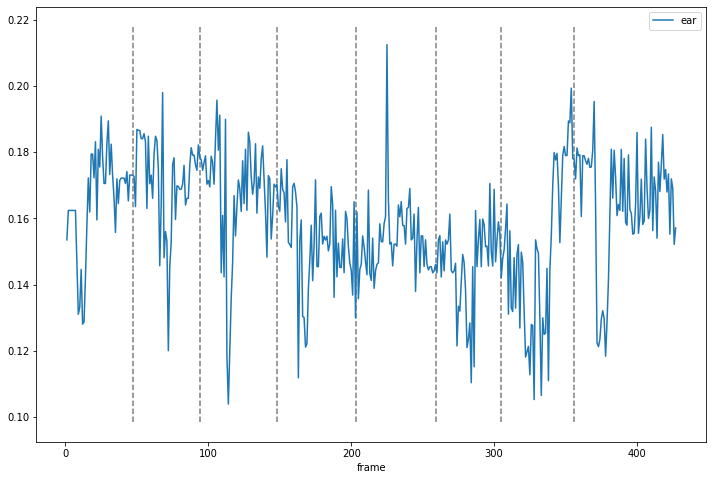

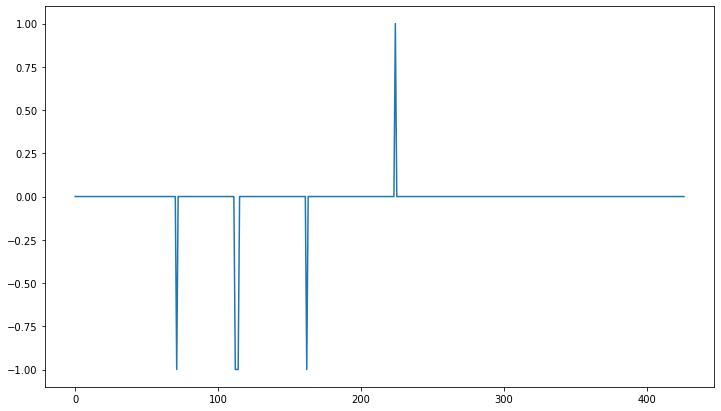

--------------------------------------------------


In [679]:
ear_preds = blink_analyse.parse_trials_stack(pred_path.EAR)

In [670]:
ear_preds.keys() #trials

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

15.140625

In [724]:
lengths = [len(t[~np.isnan(t)]) for t in ear_preds.values()]
print(f"number of blinks detected in each trial: {lengths}")
print("Avg blinks/trial: ",statistics.mean(lengths))
t = np.concatenate(list(ear_preds.values()))
print("Avg latency: ",np.mean(t[~np.isnan(t)])/0.030)

number of blinks detected in each trial: [7, 7, 6, 3, 6, 7, 7, 7, 7, 7]
Avg blinks/trial:  6.4
Avg latency:  504.6875


In [262]:
l = [len(i) for i in ear_preds.values()]
sum(l)/len(l)

9.2

## RT-Bene

median: 0.0093841552734375
Recording Name :  blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.634000
RecStop - RecStart :  13632.0
Frame Count :  409
FPS :  29.998533079067037
start times :  [1432, 3396, 5109, 6633, 8281, 9814, 11340]
stop times :  [1963, 3710, 5423, 6920, 8588, 10086, 11621]
diff :  [1432, 1433, 1399, 1210, 1361, 1226, 1254]


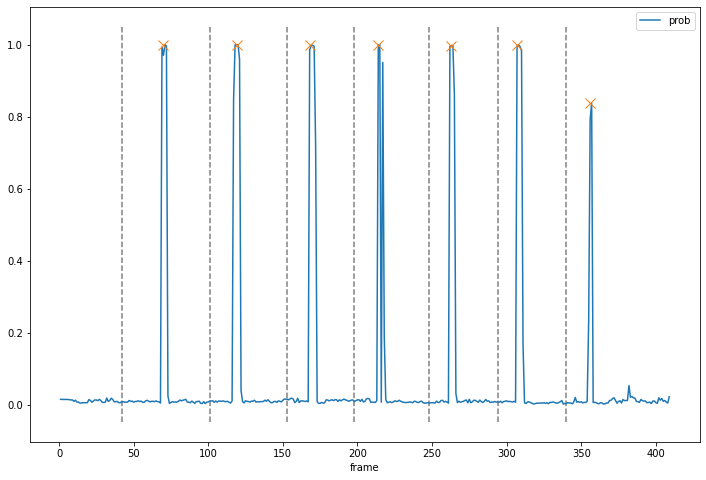

--------------------------------------------------
median: 0.010736403055489
Recording Name :  blockNr_13_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  13.436000
RecStop - RecStart :  13416.0
Frame Count :  403
FPS :  29.994045846978267
start times :  [1344, 2934, 4745, 6319, 7912, 9585, 11125]
stop times :  [1649, 3214, 5042, 6587, 8195, 9880, 11413]
diff :  [1344, 1285, 1531, 1277, 1325, 1390, 1245]


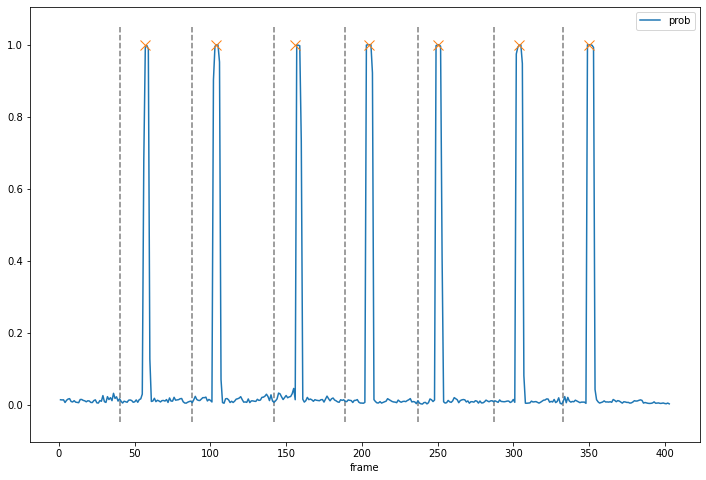

--------------------------------------------------
median: 0.01223815046250815
Recording Name :  blockNr_13_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  13.867000
RecStop - RecStart :  13858.0
Frame Count :  416
FPS :  29.999278863488858
start times :  [1211, 2933, 4659, 6542, 8147, 9931, 11576]
stop times :  [1496, 3258, 4956, 6841, 8436, 10239, 11851]
diff :  [1211, 1437, 1401, 1586, 1306, 1495, 1337]


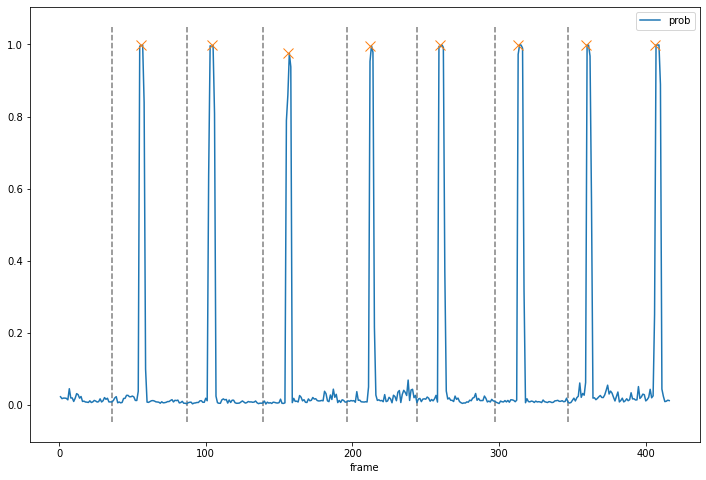

--------------------------------------------------
median: 0.0103703048080205
Recording Name :  blockNr_13_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  13.975000
RecStop - RecStart :  13967.0
Frame Count :  419
FPS :  29.982110912343472
start times :  [1385, 2929, 4549, 6339, 8161, 9968, 11637]
stop times :  [1701, 3214, 4873, 6654, 8483, 10271, 11962]
diff :  [1385, 1228, 1335, 1466, 1507, 1485, 1366]


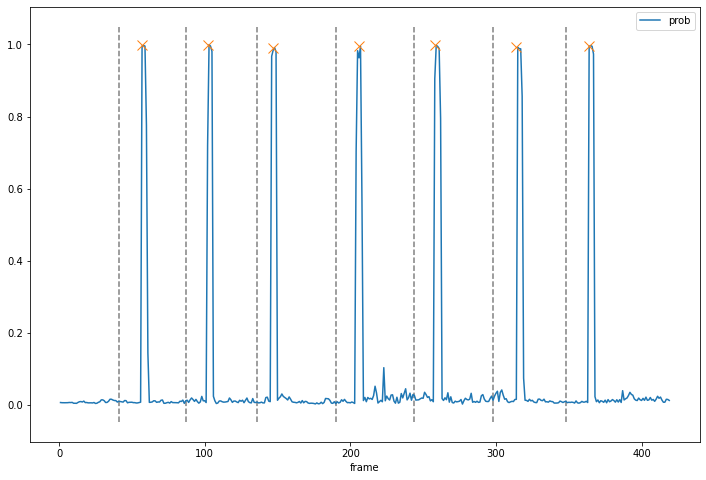

--------------------------------------------------
median: 0.0138923935592174
Recording Name :  blockNr_13_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.222000
RecStop - RecStart :  14221.0
Frame Count :  427
FPS :  30.023906623540995
start times :  [1558, 3115, 4922, 6566, 8457, 10315, 11912]
stop times :  [1869, 3407, 5247, 6849, 8789, 10635, 12211]
diff :  [1558, 1246, 1515, 1319, 1608, 1526, 1277]


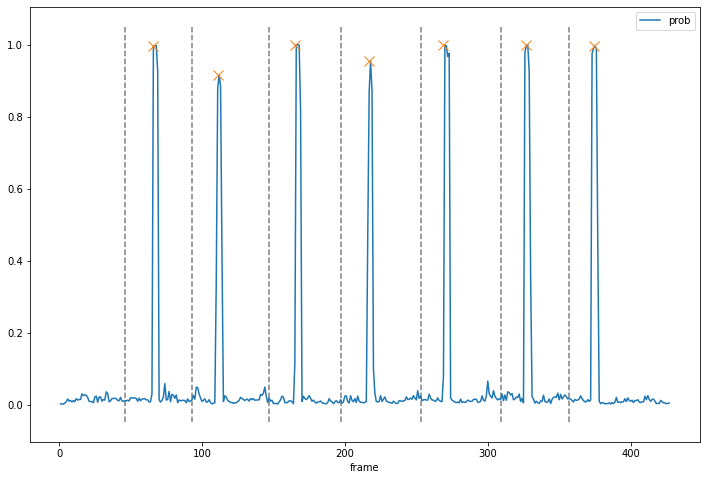

--------------------------------------------------
median: 0.0150578618049621
Recording Name :  blockNr_6_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.560000
RecStop - RecStart :  13559.0
Frame Count :  407
FPS :  30.01474926253687
start times :  [1443, 3011, 4515, 6003, 7654, 9453, 11239]
stop times :  [1744, 3289, 4785, 6285, 7964, 9767, 11546]
diff :  [1443, 1267, 1226, 1218, 1369, 1489, 1472]


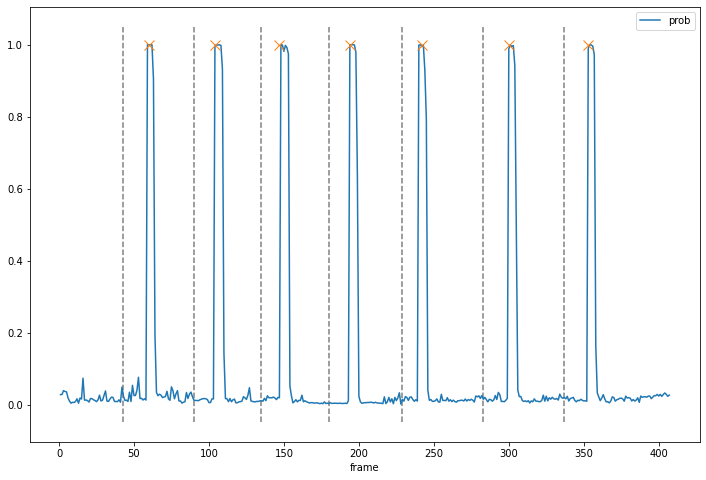

--------------------------------------------------
median: 0.01877428684383625
Recording Name :  blockNr_6_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  14.025000
RecStop - RecStart :  14043.0
Frame Count :  420
FPS :  29.946524064171122
start times :  [1297, 2832, 4714, 6578, 8251, 9938, 11731]
stop times :  [1563, 3110, 5032, 6888, 8565, 10254, 12041]
diff :  [1297, 1269, 1604, 1546, 1363, 1373, 1477]


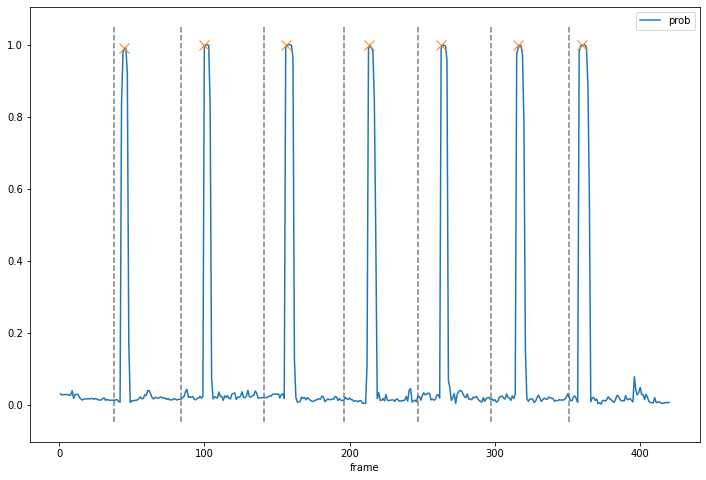

--------------------------------------------------
median: 0.0126215368509292
Recording Name :  blockNr_6_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  14.233000
RecStop - RecStart :  14238.0
Frame Count :  427
FPS :  30.00070259256657
start times :  [1418, 2993, 4841, 6617, 8221, 10037, 11914]
stop times :  [1723, 3277, 5157, 6935, 8506, 10354, 12225]
diff :  [1418, 1270, 1564, 1460, 1286, 1531, 1560]


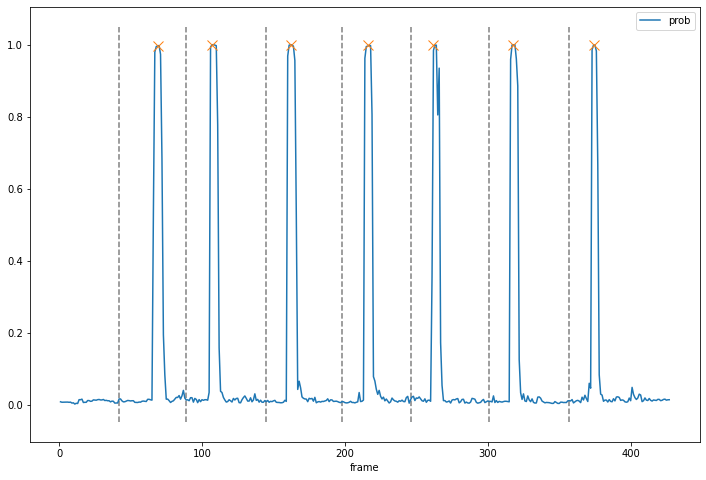

--------------------------------------------------
median: 0.0144587261602282
Recording Name :  blockNr_6_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  14.518000
RecStop - RecStart :  14522.0
Frame Count :  435
FPS :  29.962804794048765
start times :  [1357, 3073, 4831, 6660, 8595, 10408, 12190]
stop times :  [1672, 3391, 5146, 6984, 8910, 10724, 12507]
diff :  [1357, 1401, 1440, 1514, 1611, 1498, 1466]


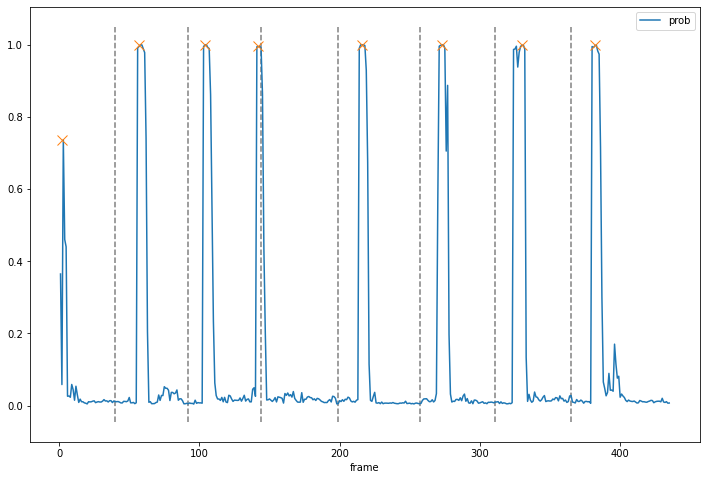

--------------------------------------------------
median: 0.0199542865157127
Recording Name :  blockNr_6_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.253000
RecStop - RecStart :  14237.0
Frame Count :  427
FPS :  29.95860520592156
start times :  [1593, 3149, 4957, 6789, 8655, 10210, 11910]
stop times :  [1895, 3447, 5282, 7098, 8974, 10479, 12226]
diff :  [1593, 1254, 1510, 1507, 1557, 1236, 1431]


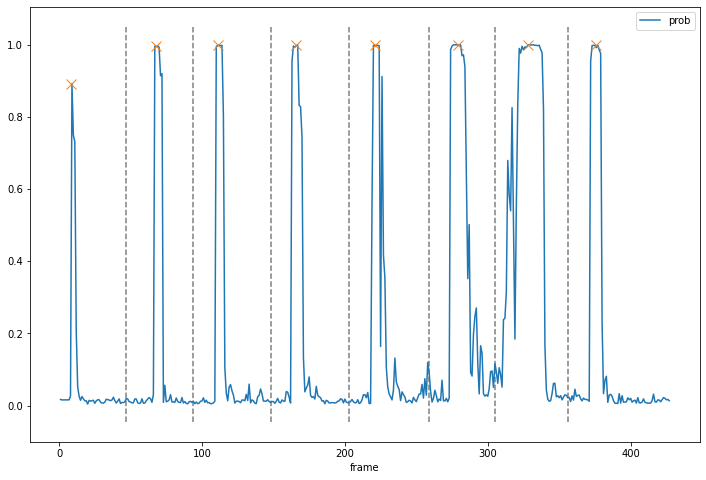

--------------------------------------------------


In [357]:
rtbene_preds = blink_analyse.parse_trials(pred_path.RT_BENE)

In [321]:
l = [len(i) for i in rtbene_preds.values()]
sum(l)/len(l)

9.0

In [279]:
del temp